In [1]:
import pandas as pd
from collections import Counter

In [2]:
df = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/analysis/object_to_attribute_relation_stats.csv')

In [6]:
Counter(df['bbox'])

Counter({'abdomen': 7,
         'aortic arch': 8,
         'cardiac silhouette': 23,
         'carina': 4,
         'cavoatrial junction': 8,
         'left apical zone': 18,
         'left arm': 8,
         'left breast': 4,
         'left chest wall': 12,
         'left clavicle': 12,
         'left costophrenic angle': 22,
         'left hemidiaphragm': 10,
         'left hilar structures': 30,
         'left lower lung zone': 37,
         'left lung': 38,
         'left mid lung zone': 36,
         'left shoulder': 7,
         'left upper lung zone': 38,
         'mediastinum': 22,
         'neck': 10,
         'right apical zone': 18,
         'right arm': 8,
         'right atrium': 8,
         'right breast': 4,
         'right chest wall': 12,
         'right clavicle': 13,
         'right costophrenic angle': 22,
         'right hemidiaphragm': 10,
         'right hilar structures': 30,
         'right lower lung zone': 37,
         'right lung': 38,
         'right mid lung z

In [7]:
df2 = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/analysis/affirmed_attributes_eval4paper.csv')

In [10]:
df2

,attribute,freq,TP,FN,FP,precision,recall,f1-score
0,nlp|yes|abnormal,1940,1805,135,183,0.907948,0.930412,0.919043
1,nlp|yes|normal,1908,1695,213,159,0.914239,0.888365,0.901116
2,anatomicalfinding|yes|lung opacity,1345,1231,114,74,0.943295,0.915242,0.929057
3,anatomicalfinding|yes|atelectasis,501,475,26,23,0.953815,0.948104,0.950951
4,anatomicalfinding|yes|pleural effusion,345,317,28,34,0.903134,0.918841,0.910920
...,...,...,...,...,...,...,...,...
65,anatomicalfinding|yes|bone lesion,2,1,1,2,0.333333,0.500000,0.400000
66,anatomicalfinding|yes|cyst/bullae,1,1,0,0,1.000000,1.000000,1.000000
67,tubesandlines|yes|mediastinal drain,1,1,0,0,1.000000,1.000000,1.000000
68,disease|yes|pericardial effusion,1,1,0,0,1.000000,1.000000,1.000000


In [12]:
df3 = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/analysis/affirmed_bboxes_across_attributes_report_level.csv')

In [13]:
df3

,bbox_name,freq,TP,FN,FP,precision,recall,f1-score
0,left lung,1453,1382,71,128,0.915232,0.951136,0.932838
1,right lung,1436,1363,73,110,0.925322,0.949164,0.937092
2,cardiac silhouette,633,617,16,27,0.958075,0.974724,0.966327
3,left lower lung zone,609,568,41,42,0.931148,0.932677,0.931911
4,mediastinum,601,573,28,30,0.950249,0.953411,0.951827
5,right lower lung zone,580,509,71,40,0.927140,0.877586,0.901683
6,right hilar structures,572,541,31,45,0.923208,0.945804,0.934370
7,left hilar structures,571,543,28,37,0.936207,0.950963,0.943527
8,upper mediastinum,359,328,31,11,0.967552,0.913649,0.939828
9,left costophrenic angle,298,276,22,34,0.890323,0.926174,0.907895


In [14]:
df4 = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/analysis/object_to_object_comparison_relation_stats.csv')

In [15]:
df4

,bbox,comparison,attribute,freq_nlp,freq_have_bboxes
0,abdomen,improved,anatomicalfinding|yes|sub-diaphragmatic air,92,92
1,abdomen,improved,nlp|yes|abnormal,215,215
2,abdomen,improved,nlp|yes|normal,12,12
3,abdomen,improved;;no change,anatomicalfinding|yes|sub-diaphragmatic air,4,4
4,abdomen,improved;;no change,nlp|yes|abnormal,8,8
...,...,...,...,...,...
2676,upper mediastinum,worsened,disease|yes|lung cancer,3,3
2677,upper mediastinum,worsened,nlp|yes|abnormal,777,774
2678,upper mediastinum,worsened,nlp|yes|normal,111,110
2679,upper mediastinum,worsened,technicalassessment|yes|artifact,4,4


In [2]:
from importlib import reload
import medvqa

In [99]:
reload(medvqa.datasets.mimiccxr)
reload(medvqa.datasets.chest_imagenome)
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)

<module 'medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management' from '/home/pamessina/medvqa/medvqa/datasets/chest_imagenome/chest_imagenome_dataset_management.py'>

In [106]:
import medvqa
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    load_silver_scene_graphs,
    extract_labels_from_scene_graph,    
    visualize_scene_graph,
    get_silver_scene_graphs_paths_for_gold_dataset,
)
from medvqa.datasets.mimiccxr import get_imageId2partId
from medvqa.datasets.chest_imagenome import CHEST_IMAGENOME_SILVER_SCENE_GRAPHS_DIR

In [258]:
silver_scene_graphs = load_silver_scene_graphs(k=1000, offset=0)

Loading scene graphs:   0%|          | 1000/243311 [00:00<01:18, 3097.92it/s]


In [262]:
len(silver_scene_graphs[1]['objects']

32

In [71]:
extract_labels_from_scene_graph(sg)

[]

In [249]:
import imagesize

width, height = imagesize.get("/mnt/data/mimic-cxr-jpg/images/p13/p13524796/s52868287/3ff686b3-3a740640-f2fe36a3-fc827ad2-bd16f29c.jpg")
print(width, height)

2544 3056


In [252]:
silver_scene_graphs[0]

{'image_id': '3ff686b3-3a740640-f2fe36a3-fc827ad2-bd16f29c',
 'viewpoint': 'AP',
 'patient_id': 13524796,
 'study_id': 52868287,
 'gender': 'M',
 'age_decile': '60-70',
 'reason_for_exam': 'Patient with cough since a week, history of pneumonia.',
 'StudyOrder': 4,
 'StudyDateTime': '2189-10-08 09:54:43 UTC',
 'objects': [{'object_id': '3ff686b3-3a740640-f2fe36a3-fc827ad2-bd16f29c_right lung',
   'x1': 30,
   'y1': 6,
   'x2': 110,
   'y2': 167,
   'width': 80,
   'height': 161,
   'bbox_name': 'right lung',
   'synsets': ['C0225706'],
   'name': 'Right lung',
   'original_x1': 150,
   'original_y1': 81,
   'original_x2': 1241,
   'original_y2': 2278,
   'original_width': 1091,
   'original_height': 2197,
   'x1_256_padded': 33,
   'y1_256_padded': 6,
   'x2_256_padded': 124,
   'y2_256_padded': 190},
  {'object_id': '3ff686b3-3a740640-f2fe36a3-fc827ad2-bd16f29c_right upper lung zone',
   'x1': 49,
   'y1': 11,
   'x2': 110,
   'y2': 71,
   'width': 61,
   'height': 60,
   'bbox_name': 

In [87]:
labels = []
for sg in silver_scene_graphs:
    labels.append(extract_labels_from_scene_graph(sg))

In [88]:
labels[-1]

[('right lung', 'anatomicalfinding', 'airspace opacity', 1),
 ('right lung', 'anatomicalfinding', 'lung opacity', 1),
 ('right lung', 'nlp', 'abnormal', 1),
 ('right upper lung zone', 'anatomicalfinding', 'airspace opacity', 1),
 ('right upper lung zone', 'anatomicalfinding', 'lung opacity', 1),
 ('right upper lung zone', 'nlp', 'abnormal', 1),
 ('right mid lung zone', 'anatomicalfinding', 'airspace opacity', 1),
 ('right mid lung zone', 'anatomicalfinding', 'lung opacity', 1),
 ('right mid lung zone', 'nlp', 'abnormal', 1)]

In [108]:
imageId2partId = get_imageId2partId()

In [91]:
from medvqa.datasets.mimiccxr.preprocessing import image_paths_generator
from medvqa.datasets.mimiccxr import MIMICCXR_IMAGE_REGEX

In [95]:
MIMICCXR_IMAGE_REGEX.findall(str(next(image_paths_generator())))

[('10',
  '10075925',
  '51010496',
  '4cfccdcb-122eefe2-ccd1cbbd-c93635de-eda3823c')]

Image path: /mnt/data/mimic-cxr-jpg/images/p18/p18611996/s50365077/b363546c-f2c3b5ca-ce561902-5db723bd-34506f99.jpg
Object: right lung (341, -27, 1214, 2087)
Object: right upper lung zone (573, 27, 982, 805)
Object: right mid lung zone (463, 832, 1024, 450)
Object: right lower lung zone (341, 1282, 1077, 778)
Object: right hilar structures (968, 736, 546, 628)
Object: right apical zone (764, -27, 791, 409)
Object: right costophrenic angle (204, 1855, 273, 273)
Object: right cardiophrenic angle (1214, 1528, 123, 327)
Object: right hemidiaphragm (341, 1596, 1268, 464)
Object: left lung (1705, 0, 1132, 2101)
Object: left upper lung zone (1705, 54, 887, 778)
Object: left mid lung zone (1719, 832, 1009, 464)
Object: left lower lung zone (1719, 1296, 1118, 805)
Object: left hilar structures (1705, 736, 518, 641)
Object: left apical zone (1719, 0, 695, 382)
Object: left costophrenic angle (2701, 1896, 273, 273)
Object: left hemidiaphragm (1705, 1691, 1132, 410)
Object: trachea (1282, 54, 518,

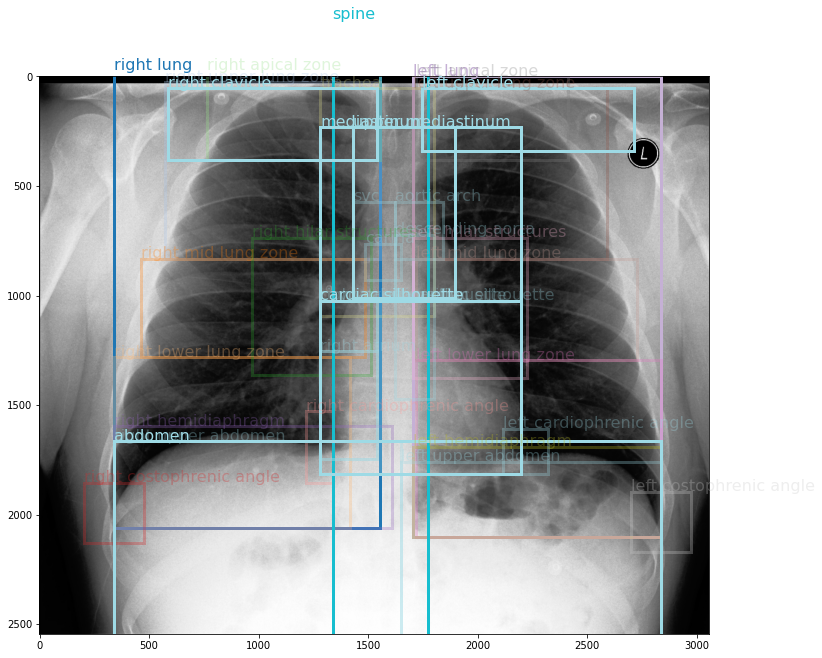

Labels:
('right lung', 'anatomicalfinding', 'lung opacity', 0)
('right lung', 'nlp', 'normal', 1)
('right lung', 'nlp', 'abnormal', 0)
('right lung', 'nlp', 'normal', 1)
('left lung', 'anatomicalfinding', 'lung opacity', 0)
('left lung', 'nlp', 'normal', 1)
('left lung', 'nlp', 'abnormal', 0)
('left lung', 'nlp', 'normal', 1)
('mediastinum', 'anatomicalfinding', 'mediastinal displacement', 0)
('mediastinum', 'anatomicalfinding', 'mediastinal widening', 0)
('mediastinum', 'anatomicalfinding', 'superior mediastinal mass/enlargement', 0)
('mediastinum', 'nlp', 'normal', 1)
('mediastinum', 'nlp', 'abnormal', 0)
('mediastinum', 'nlp', 'normal', 1)
('upper mediastinum', 'anatomicalfinding', 'mediastinal displacement', 0)
('upper mediastinum', 'anatomicalfinding', 'mediastinal widening', 0)
('upper mediastinum', 'anatomicalfinding', 'superior mediastinal mass/enlargement', 0)
('upper mediastinum', 'nlp', 'normal', 1)
('cardiac silhouette', 'anatomicalfinding', 'enlarged cardiac silhouette', 0

In [280]:
visualize_scene_graph(silver_scene_graphs[2], imageId2partId, figsize=(12, 12))

Image path: /mnt/data/mimic-cxr-jpg/images/p11/p11255133/s50857798/d784c870-cccb726f-ba44b7d4-703efff1-45f36555.jpg
Object: right lung (504, 545, 778, 1569)
Object: right upper lung zone (600, 613, 682, 614)
Object: right mid lung zone (573, 1227, 695, 328)
Object: right lower lung zone (504, 1555, 751, 559)
Object: right hilar structures (914, 1159, 354, 450)
Object: right apical zone (627, 545, 655, 464)
Object: right costophrenic angle (368, 1937, 273, 273)
Object: right cardiophrenic angle (982, 1814, 150, 341)
Object: right hemidiaphragm (504, 1896, 928, 218)
Object: left lung (1446, 532, 859, 1705)
Object: left upper lung zone (1446, 600, 764, 627)
Object: left mid lung zone (1487, 1227, 777, 369)
Object: left lower lung zone (1487, 1596, 818, 641)
Object: left hilar structures (1459, 1146, 410, 518)
Object: left apical zone (1446, 532, 723, 477)
Object: left costophrenic angle (2169, 2046, 273, 273)
Object: left hemidiaphragm (1446, 1978, 859, 259)
Object: trachea (1118, 354, 46

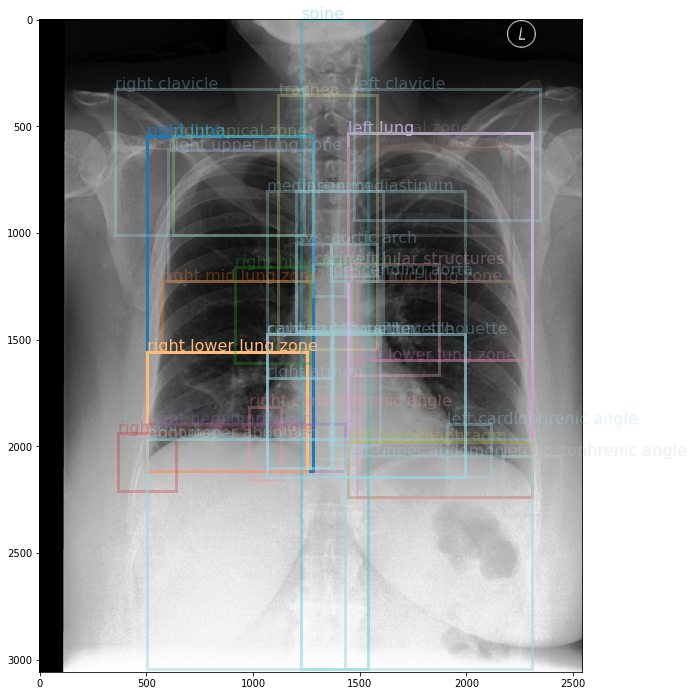

Labels:
('right lung', 'anatomicalfinding', 'lung opacity', 1)
('right lung', 'anatomicalfinding', 'pleural/parenchymal scarring', 1)
('right lung', 'disease', 'pneumonia', 1)
('right lung', 'nlp', 'abnormal', 1)
('right lung', 'disease', 'pneumonia', 0)
('right lung', 'nlp', 'abnormal', 0)
('right lower lung zone', 'anatomicalfinding', 'lung opacity', 1)
('right lower lung zone', 'anatomicalfinding', 'pleural/parenchymal scarring', 1)
('right lower lung zone', 'disease', 'pneumonia', 1)
('right lower lung zone', 'nlp', 'abnormal', 1)
('left lung', 'disease', 'pneumonia', 0)
('left lung', 'nlp', 'abnormal', 0)

--------------------------------------------------------------------------------
Original report:
                                 FINAL REPORT
 HISTORY:  Focal bronchiectasis with fever.
 
 FINDINGS:  In comparison with study of ___, there is less opacification at
 the right base, with a configuration that could well reflect scarring from
 previous infection.  No evidence of ac

In [246]:
visualize_scene_graph(silver_scene_graphs[-2], imageId2partId, figsize=(12, 12))

In [104]:
from medvqa.utils.files import load_json_file
import os
from medvqa.datasets.chest_imagenome import CHEST_IMAGENOME_SILVER_SCENE_GRAPHS_DIR

Image path: /mnt/data/mimic-cxr-jpg/images/p11/p11482361/s56338562/b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54.jpg
Object: right lung (300, 613, 982, 2074)
Object: right upper lung zone (450, 682, 832, 655)
Object: right mid lung zone (382, 1337, 832, 491)
Object: right lower lung zone (300, 1828, 859, 859)
Object: right hilar structures (791, 1227, 450, 696)
Object: right apical zone (518, 613, 764, 464)
Object: right costophrenic angle (163, 2483, 273, 272)
Object: right cardiophrenic angle (1064, 2182, 95, 232)
Object: right hemidiaphragm (300, 2237, 1064, 450)
Object: left lung (1391, 668, 860, 1883)
Object: left upper lung zone (1418, 723, 751, 614)
Object: left mid lung zone (1391, 1337, 819, 436)
Object: left lower lung zone (1432, 1773, 819, 778)
Object: left hilar structures (1391, 1241, 409, 614)
Object: left apical zone (1432, 668, 682, 409)
Object: left costophrenic angle (2114, 2346, 273, 273)
Object: left hemidiaphragm (1391, 2223, 860, 328)
Object: trachea (1077, 300, 3

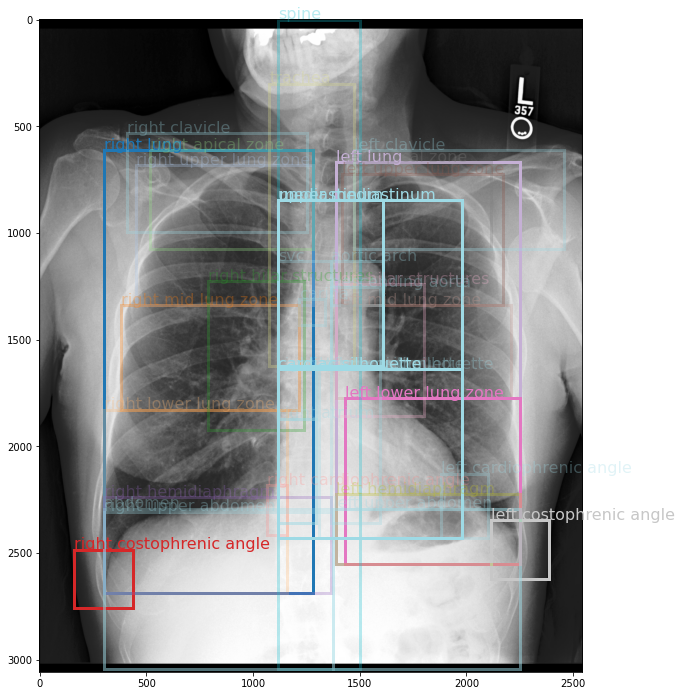

Labels:
('right lung', 'anatomicalfinding', 'pleural effusion', 0)
('right lung', 'anatomicalfinding', 'pneumothorax', 0)
('right lung', 'nlp', 'abnormal', 0)
('right lung', 'nlp', 'normal', 1)
('right lung', 'anatomicalfinding', 'consolidation', 0)
('right costophrenic angle', 'anatomicalfinding', 'pleural effusion', 0)
('left lung', 'anatomicalfinding', 'pleural effusion', 0)
('left lung', 'anatomicalfinding', 'pneumothorax', 0)
('left lung', 'nlp', 'abnormal', 0)
('left lung', 'nlp', 'normal', 1)
('left lung', 'anatomicalfinding', 'atelectasis', 1)
('left lung', 'anatomicalfinding', 'lung opacity', 1)
('left lung', 'nlp', 'abnormal', 1)
('left lung', 'anatomicalfinding', 'consolidation', 0)
('left lower lung zone', 'anatomicalfinding', 'atelectasis', 1)
('left lower lung zone', 'anatomicalfinding', 'lung opacity', 1)
('left lower lung zone', 'nlp', 'abnormal', 1)
('left costophrenic angle', 'anatomicalfinding', 'pleural effusion', 0)
('mediastinum', 'anatomicalfinding', 'mediastinal

In [111]:
visualize_scene_graph(load_json_file(os.path.join(CHEST_IMAGENOME_SILVER_SCENE_GRAPHS_DIR,
                                             'b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54_SceneGraph.json')),
                      figsize=(12, 12))

## Visualize examples from gold dataset

In [10]:
import pandas as pd
import os
from medvqa.utils.files import load_json_file

In [7]:
gold_scene_graphs_paths = get_silver_scene_graphs_paths_for_gold_dataset()

In [8]:
len(gold_scene_graphs_paths)

1000

Image path: /mnt/data/mimic-cxr-jpg/images/p10/p10098993/s52050071/01e55956-89f296bb-002ac02d-e08ee2a9-832f1cff.jpg
Object: right lung (150, 654, 1077, 2388)
Object: right upper lung zone (382, 723, 845, 777)
Object: right mid lung zone (245, 1500, 887, 560)
Object: right lower lung zone (150, 2060, 968, 982)
Object: right hilar structures (682, 1377, 491, 792)
Object: right apical zone (477, 654, 750, 560)
Object: right costophrenic angle (13, 2837, 273, 205)
Object: right cardiophrenic angle (613, 2387, 260, 409)
Object: right hemidiaphragm (150, 2523, 1173, 519)
Object: left lung (1323, 723, 996, 2319)
Object: left upper lung zone (1364, 791, 832, 709)
Object: left mid lung zone (1323, 1500, 955, 560)
Object: left lower lung zone (1405, 2060, 914, 982)
Object: left hilar structures (1323, 1377, 477, 792)
Object: left apical zone (1418, 723, 696, 491)
Object: left costophrenic angle (2182, 2824, 273, 218)
Object: left hemidiaphragm (1323, 2537, 996, 505)
Object: trachea (982, 504, 38

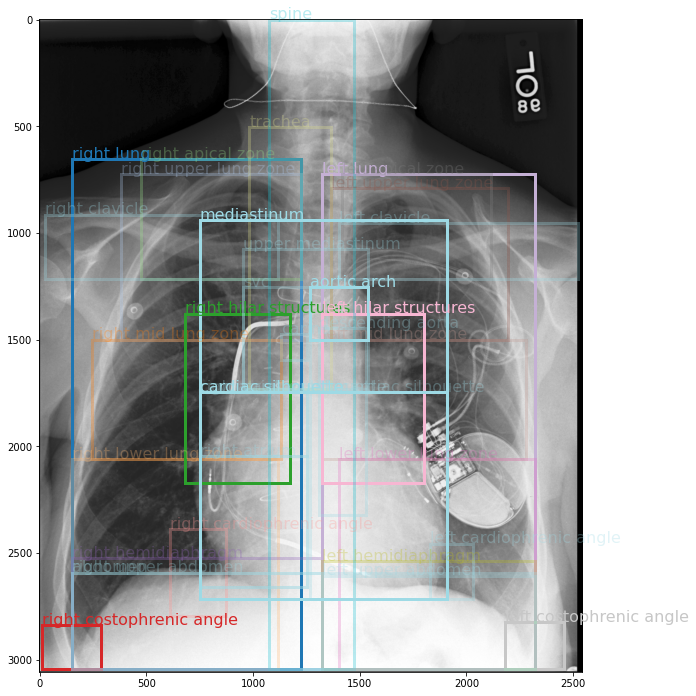

Labels:
('right lung', 'anatomicalfinding', 'lung opacity', 0)
('right lung', 'nlp', 'normal', 1)
('right lung', 'anatomicalfinding', 'pleural effusion', 0)
('right lung', 'anatomicalfinding', 'vascular congestion', 0)
('right lung', 'nlp', 'abnormal', 0)
('right lung', 'nlp', 'normal', 1)
('right lung', 'nlp', 'abnormal', 0)
('right lung', 'nlp', 'normal', 1)
('right hilar structures', 'anatomicalfinding', 'vascular congestion', 0)
('right hilar structures', 'nlp', 'abnormal', 0)
('right hilar structures', 'nlp', 'normal', 1)
('right costophrenic angle', 'anatomicalfinding', 'pleural effusion', 0)
('left lung', 'anatomicalfinding', 'lung opacity', 0)
('left lung', 'nlp', 'normal', 1)
('left lung', 'anatomicalfinding', 'pleural effusion', 0)
('left lung', 'anatomicalfinding', 'vascular congestion', 0)
('left lung', 'nlp', 'abnormal', 0)
('left lung', 'nlp', 'normal', 1)
('left lung', 'nlp', 'abnormal', 0)
('left lung', 'nlp', 'normal', 1)
('left hilar structures', 'anatomicalfinding', 

In [14]:
visualize_scene_graph(load_json_file(gold_scene_graphs_paths[10]), figsize=(12,12))

In [197]:
from medvqa.scripts.chest_imagenome.precompute_labels import load_scene_graphs

In [208]:
output = load_scene_graphs(num_workers=1, first_k=10000)

Elapsed time: 10.20 seconds


In [204]:
output[0]

{'image_id': 'b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54',
 'viewpoint': 'AP',
 'patient_id': 11482361,
 'study_id': 56338562,
 'gender': 'F',
 'age_decile': '50-60',
 'reason_for_exam': '___F with recent fall, pain along left ribs  // left rib\n fractrue',
 'StudyOrder': 1,
 'StudyDateTime': '2142-10-05 09:40:22 UTC',
 'objects': [{'object_id': 'b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54_right lung',
   'x1': 41,
   'y1': 45,
   'x2': 113,
   'y2': 197,
   'width': 72,
   'height': 152,
   'bbox_name': 'right lung',
   'synsets': ['C0225706'],
   'name': 'Right lung',
   'original_x1': 300,
   'original_y1': 613,
   'original_x2': 1282,
   'original_y2': 2687,
   'original_width': 982,
   'original_height': 2074,
   'x1_256_padded': 46,
   'y1_256_padded': 51,
   'x2_256_padded': 128,
   'y2_256_padded': 225},
  {'object_id': 'b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54_right upper lung zone',
   'x1': 52,
   'y1': 50,
   'x2': 113,
   'y2': 98,
   'width': 61,
   'height': 48,
 

In [112]:
!python ../../scripts/chest_imagenome/precompute_labels.py --num_workers=10 --min_freq=100

python: can't open file '../../scripts/chest_imagenome/precompute_labels.py': [Errno 2] No such file or directory


In [5]:
from medvqa.utils.files import load_pickle

In [6]:
labels = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=100).pkl')

In [8]:
len(labels)

627

In [9]:
from collections import Counter
Counter(len(x) for x in labels)

Counter({3: 553, 2: 74})

In [238]:
labels

[('abdomen', 'anatomicalfinding', 'sub-diaphragmatic air'),
 ('abdomen', 'nlp', 'abnormal'),
 ('abdomen', 'tubesandlines', 'enteric tube'),
 ('abdomen', 'tubesandlines', 'swan-ganz catheter'),
 ('aortic arch', 'anatomicalfinding', 'mediastinal widening'),
 ('aortic arch', 'anatomicalfinding', 'tortuous aorta'),
 ('aortic arch', 'anatomicalfinding', 'vascular calcification'),
 ('aortic arch', 'device', 'aortic graft/repair'),
 ('aortic arch', 'nlp', 'abnormal'),
 ('aortic arch', 'tubesandlines', 'intra-aortic balloon pump'),
 ('cardiac silhouette', 'anatomicalfinding', 'enlarged cardiac silhouette'),
 ('cardiac silhouette', 'anatomicalfinding', 'hernia'),
 ('cardiac silhouette', 'anatomicalfinding', 'mediastinal displacement'),
 ('cardiac silhouette', 'anatomicalfinding', 'pneumomediastinum'),
 ('cardiac silhouette', 'anatomicalfinding', 'vascular calcification'),
 ('cardiac silhouette', 'device', 'aortic graft/repair'),
 ('cardiac silhouette', 'device', 'cabg grafts'),
 ('cardiac silho

In [13]:
for x in [
    'right lung',
    'right upper lung zone',
    'right mid lung zone',
    'right lower lung zone',
    'right hilar structures',
    'right apical zone',
    'right costophrenic angle',
    'right cardiophrenic angle',
    'right hemidiaphragm',
    'left lung',
    'left upper lung zone',
    'left mid lung zone',
    'left lower lung zone',
    'left hilar structures',
    'left apical zone',
    'left costophrenic angle',
    'left hemidiaphragm',
    'trachea',
    'spine',
    'right clavicle',
    'left clavicle',
    'aortic arch',
    'mediastinum',
    'upper mediastinum',
    'svc',
    'cardiac silhouette',
    'left cardiac silhouette',
    'right cardiac silhouette',
    'cavoatrial junction',
    'right atrium',
    'descending aorta',
    'carina',
    'left upper abdomen',
    'right upper abdomen',
    'abdomen',
    'left cardiophrenic angle',
]:
    print(x)

right lung
right upper lung zone
right mid lung zone
right lower lung zone
right hilar structures
right apical zone
right costophrenic angle
right cardiophrenic angle
right hemidiaphragm
left lung
left upper lung zone
left mid lung zone
left lower lung zone
left hilar structures
left apical zone
left costophrenic angle
left hemidiaphragm
trachea
spine
right clavicle
left clavicle
aortic arch
mediastinum
upper mediastinum
svc
cardiac silhouette
left cardiac silhouette
right cardiac silhouette
cavoatrial junction
right atrium
descending aorta
carina
left upper abdomen
right upper abdomen
abdomen
left cardiophrenic angle


In [226]:
imageId2labels = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels.pkl')

In [228]:
def print_labels(image_id):
    x = imageId2labels[image_id]
    for i, label in enumerate(labels):
        if x[i]: print(label)

In [231]:
print_labels('d784c870-cccb726f-ba44b7d4-703efff1-45f36555')

('right lower lung zone', 'anatomicalfinding', 'lung opacity')
('right lower lung zone', 'anatomicalfinding', 'pleural/parenchymal scarring')
('right lower lung zone', 'disease', 'pneumonia')
('right lower lung zone', 'nlp', 'abnormal')
('right lung', 'anatomicalfinding', 'lung opacity')
('right lung', 'anatomicalfinding', 'pleural/parenchymal scarring')


In [14]:
!python ../../scripts/chest_imagenome/postprocess_bboxes.py --num_workers=4

Loading scene graphs with 4 workers
Elapsed time: 717.62 seconds
Loaded 243311 scene graphs
377110it [00:58, 6487.57it/s]
 10%|███▍                              | 24317/243311 [09:56<4:31:34, 13.44it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



100%|█████████████████████████████████| 243311/243311 [1:34:58<00:00, 42.70it/s]
Saving imageId2bboxcoords to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/bboxes.pkl


In [1]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import visualize_bounding_boxes

Image path: /mnt/data/mimic-cxr-jpg/images/p19/p19008705/s58778515/f9adbc1b-0d4818cd-caa6cf4c-23d2f999-2da5c807.jpg
Object: right lung (286.0, 286.0, 1078.0, 1733.0)
Object: right upper lung zone (463.0, 341.0, 901.0, 627.0)
Object: right mid lung zone (368.0, 968.0, 955.0, 382.0)
Object: right lower lung zone (286.0, 1350.0, 1010.0, 669.0)
Object: right hilar structures (845.0, 886.0, 492.0, 532.0)
Object: right apical zone (641.0, 286.0, 723.0, 368.0)
Object: right costophrenic angle (150.0, 1759.0, 272.0, 273.0)
Object: right cardiophrenic angle (955.0, 1609.0, 122.0, 492.0)
Object: right hemidiaphragm (286.0, 1678.0, 1078.0, 341.0)
Object: left lung (1528.0, 327.0, 914.0, 1855.0)
Object: left upper lung zone (1528.0, 368.0, 845.0, 600.0)
Object: left mid lung zone (1528.0, 968.0, 886.0, 437.0)
Object: left lower lung zone (1528.0, 1405.0, 914.0, 777.0)
Object: left hilar structures (1528.0, 873.0, 436.0, 614.0)
Object: left apical zone (1555.0, 327.0, 655.0, 327.0)
Object: left cos

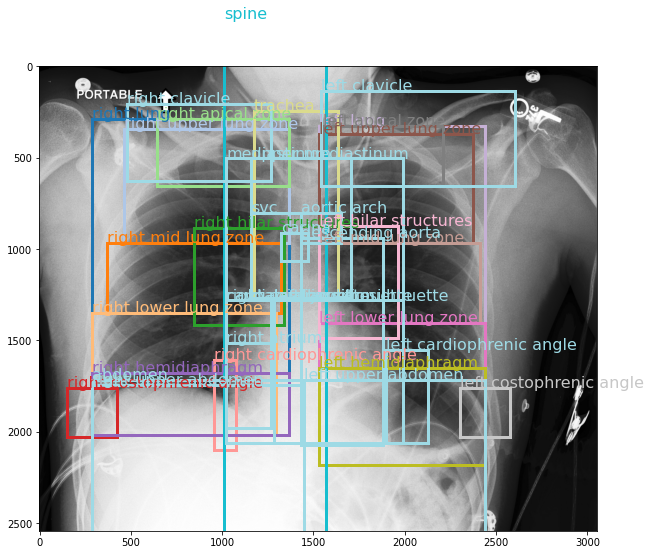

Image path: /mnt/workspace/mimic-cxr-jpg/images-small/p19/p19008705/s58778515/f9adbc1b-0d4818cd-caa6cf4c-23d2f999-2da5c807.jpg


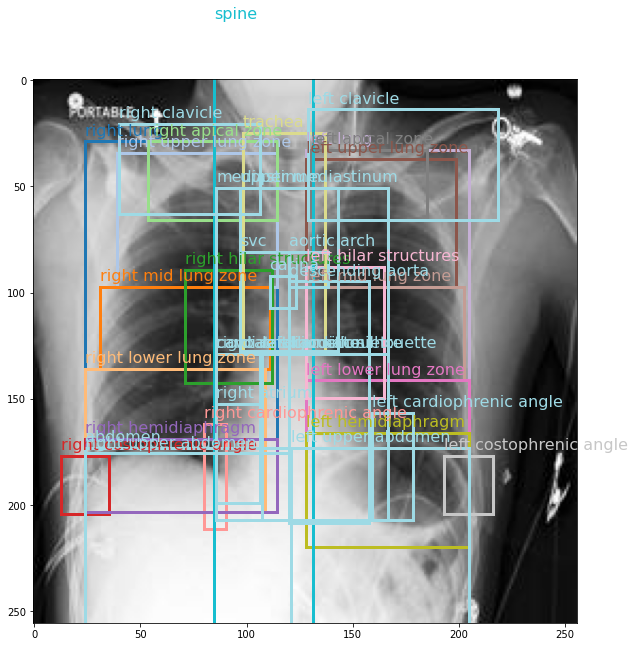

In [4]:
visualize_bounding_boxes('f9adbc1b-0d4818cd-caa6cf4c-23d2f999-2da5c807')

In [17]:
tmp = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/bboxes.pkl')

In [18]:
len(tmp)

243310

In [32]:
tmp['fc0adf90-3c1e3686-ce8f57ba-82462218-bb3e9400']

{'coords': array([0.0859068 , 0.10242454, 0.50645703, 0.86590797, 0.18192028,
        0.12469075, 0.50645703, 0.36566058, 0.12633352, 0.36566058,
        0.49129704, 0.54873824, 0.0859068 , 0.54873824, 0.460977  ,
        0.86590797, 0.30881527, 0.3255814 , 0.49635038, 0.5843642 ,
        0.22796182, 0.10242454, 0.50645703, 0.25878277, 0.03537339,
        0.7941613 , 0.1364402 , 0.88372093, 0.35429534, 0.6338446 ,
        0.41493544, 0.7273627 , 0.0859068 , 0.66056406, 0.53172374,
        0.86590797, 0.55699044, 0.12469075, 0.8860191 , 0.9015339 ,
        0.55699044, 0.14250371, 0.84053904, 0.36566058, 0.55699044,
        0.36566058, 0.8759124 , 0.5576447 , 0.55699044, 0.5576447 ,
        0.8860191 , 0.9015339 , 0.55699044, 0.3255814 , 0.7142055 ,
        0.59327066, 0.57215047, 0.12469075, 0.80516565, 0.25878277,
        0.8354857 , 0.8258288 , 0.937114  , 0.9148936 , 0.55699044,
        0.73181593, 0.8860191 , 0.9015339 , 0.4351488 , 0.00445324,
        0.5620438 , 0.4774864 , 0.4300

In [31]:
for i, k in enumerate(tmp.keys()):
    print(k, tmp[k])
    if i > 1: break

b1b1aa2a-7e114d6d-0879953c-b69a25f6-e7d82b54 {'coords': array([0.11792453, 0.200589  , 0.5039308 , 0.8792539 , 0.1768868 ,
       0.22316754, 0.5039308 , 0.4375    , 0.15015723, 0.4375    ,
       0.47720125, 0.59816754, 0.11792453, 0.59816754, 0.45558175,
       0.8792539 , 0.31092766, 0.40150523, 0.48781446, 0.6292539 ,
       0.20361635, 0.200589  , 0.5039308 , 0.35242146, 0.06407233,
       0.8125    , 0.17138365, 0.90150523, 0.418239  , 0.71400523,
       0.45558175, 0.78992146, 0.11792453, 0.7320026 , 0.5361635 ,
       0.8792539 , 0.5467767 , 0.21858639, 0.884827  , 0.8347513 ,
       0.5573899 , 0.23658377, 0.8525943 , 0.4375    , 0.5467767 ,
       0.4375    , 0.8687107 , 0.58017015, 0.5628931 , 0.58017015,
       0.884827  , 0.8347513 , 0.5467767 , 0.4060864 , 0.7075472 ,
       0.6070026 , 0.5628931 , 0.21858639, 0.8309748 , 0.35242146,
       0.8309748 , 0.76767015, 0.9382862 , 0.8570026 , 0.5467767 ,
       0.72742146, 0.884827  , 0.8347513 , 0.42334905, 0.09816754,
      

# Inspecting anomalous bounding boxes (whole dataset)

In [33]:
from importlib import reload
import medvqa

In [91]:
reload(medvqa.evaluation.visual_module)

<module 'medvqa.evaluation.visual_module' from '/home/pamessina/medvqa/medvqa/evaluation/visual_module.py'>

In [126]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    load_chest_imagenome_train_average_bbox_coords,
    load_chest_imagenome_silver_bboxes,
)
from medvqa.evaluation.visual_module import ChestImagenomeBboxPredictionsVisualizer
import numpy as np

In [127]:
average_bbox_coords = load_chest_imagenome_train_average_bbox_coords("qa_adapted_reports__20220904_095810.json")

Loading /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(qa_adapted_reports__20220904_095810.json,clamped.pkl...


In [128]:
average_bbox_coords.shape

(144,)

In [64]:
bbox_dict = load_chest_imagenome_silver_bboxes()

In [65]:
dicom_ids = list(bbox_dict.keys())
print('milestone 1')
pred_bbox_coords = np.expand_dims(average_bbox_coords, 0).repeat(len(dicom_ids), 0)
print('milestone 2')
pred_bbox_presences = np.ones((len(dicom_ids), 36))
print('milestone 3')
test_bbox_coords = [x['coords'] for x in bbox_dict.values()]
print('milestone 4')
test_bbox_presences = [x['presence'] for x in bbox_dict.values()]
print('milestone 5')

milestone 1
milestone 2
milestone 3
milestone 4
milestone 5


In [66]:
bbox_pred_visualizer = ChestImagenomeBboxPredictionsVisualizer(
    data = dict(
        dicom_ids=dicom_ids,
        pred_bbox_coords=pred_bbox_coords,
        pred_bbox_presences=pred_bbox_presences,
        test_bbox_coords=test_bbox_coords,
        test_bbox_presences=test_bbox_presences,
    )
)

100%|██████████| 243310/243310 [02:14<00:00, 1810.51it/s]

Processed 243310 predictions
IoU mean: 0.8401, std: 0.0753


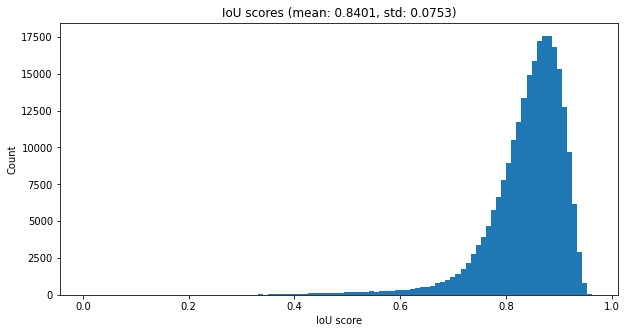

In [67]:
bbox_pred_visualizer.plot_iou_scores(figsize=(10, 5))

In [68]:
print(f'IoU mean: {bbox_pred_visualizer.iou_scores_mean:.4f}')
print(f'IoU std: {bbox_pred_visualizer.iou_scores_std:.4f}')
print(f'IoU min: {np.min(bbox_pred_visualizer.iou_scores):.4f}')
print(f'IoU max: {np.max(bbox_pred_visualizer.iou_scores):.4f}')
# Number of predictions with IoU between consecutive thresholds
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
acc_count = 0
for i in range(len(thresholds)):
    if i == 0:
        count = np.sum(bbox_pred_visualizer.iou_scores <= thresholds[i])
        acc_count += count
        print(f'IoU <= {thresholds[i]:.1f}: {count}, cumulative: {acc_count}')
    else:
        count = np.sum((bbox_pred_visualizer.iou_scores > thresholds[i-1]) & (bbox_pred_visualizer.iou_scores <= thresholds[i]))
        acc_count += count
        print(f'{thresholds[i-1]:.1f} < IoU <= {thresholds[i]:.1f}: {count}, cumulative: {acc_count}')

IoU mean: 0.8401
IoU std: 0.0753
IoU min: 0.0039
IoU max: 0.9639
IoU <= 0.1: 42, cumulative: 42
0.1 < IoU <= 0.2: 38, cumulative: 80
0.2 < IoU <= 0.3: 87, cumulative: 167
0.3 < IoU <= 0.4: 356, cumulative: 523
0.4 < IoU <= 0.5: 1119, cumulative: 1642
0.5 < IoU <= 0.6: 2397, cumulative: 4039
0.6 < IoU <= 0.7: 6398, cumulative: 10437
0.7 < IoU <= 0.8: 40181, cumulative: 50618
0.8 < IoU <= 0.9: 150557, cumulative: 201175
0.9 < IoU <= 1.0: 42135, cumulative: 243310


IoU score: 0.2353
DICOM ID: 2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb
Predicted bounding box coordinates: [1.05148660e-01 1.22529661e-01 4.77127723e-01 7.74183709e-01
 1.72837049e-01 1.44388437e-01 4.73952769e-01 3.85893992e-01
 1.44196755e-01 3.87462546e-01 4.58187573e-01 5.28276827e-01
 1.06961788e-01 5.28367235e-01 4.45662707e-01 7.75880181e-01
 2.99972865e-01 3.57182180e-01 4.66738889e-01 5.54473949e-01
 2.12444605e-01 1.26029967e-01 4.72270263e-01 2.78598189e-01
 6.57005388e-02 6.89231841e-01 1.59519235e-01 7.85931552e-01
 3.34076246e-01 5.97290035e-01 3.95323313e-01 7.20443794e-01
 1.06374009e-01 6.27654638e-01 5.09149407e-01 7.81137524e-01
 5.20052471e-01 1.22679751e-01 8.93153191e-01 7.90403177e-01
 5.29212996e-01 1.45072918e-01 8.30667749e-01 3.85841090e-01
 5.32422735e-01 3.87077786e-01 8.58442465e-01 5.33856159e-01
 5.38682949e-01 5.33671096e-01 8.91221251e-01 7.91613565e-01
 5.25630127e-01 3.55670873e-01 6.94918134e-01 5.61248333e-01
 5.34310687e-01 1.26902879e-01 7.9397

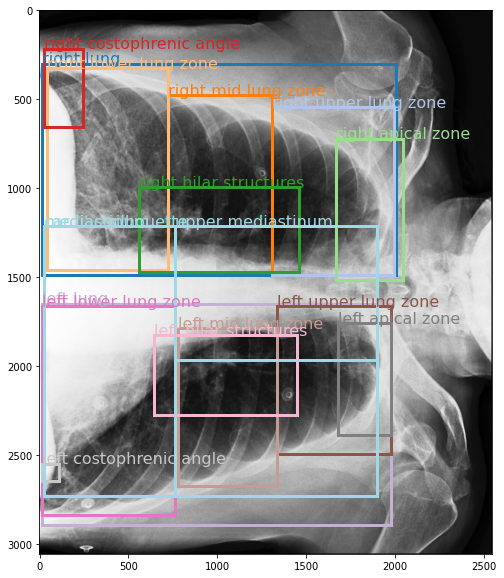

Image path: /mnt/data/mimic-cxr-jpg/images/p19/p19931382/s50437364/2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb.jpg


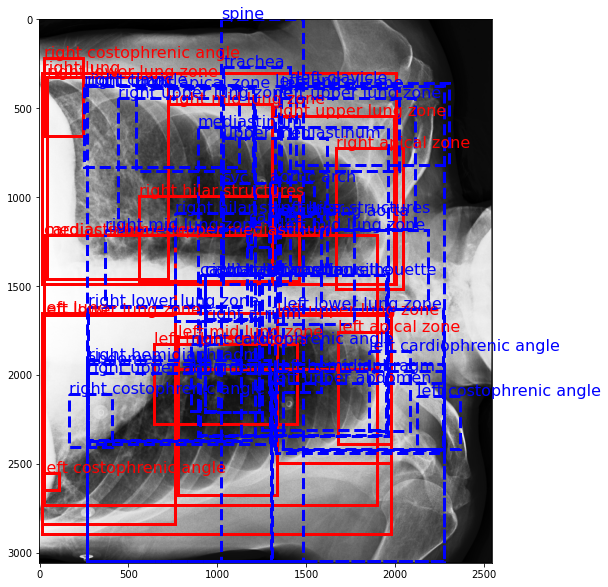

In [94]:
bbox_pred_visualizer.visualize_bbox_predictions_example(100)

In [855]:
reload(medvqa.datasets.data_inspection_utils)

<module 'medvqa.datasets.data_inspection_utils' from '/home/pamessina/medvqa/medvqa/datasets/data_inspection_utils.py'>

In [856]:
from medvqa.datasets.data_inspection_utils import plot_chest_imagenome_iou_mean_std_per_bbox_class

Computing IoU mean and std per bounding box class in parallel with 8 workers...
Done in 27.13 seconds


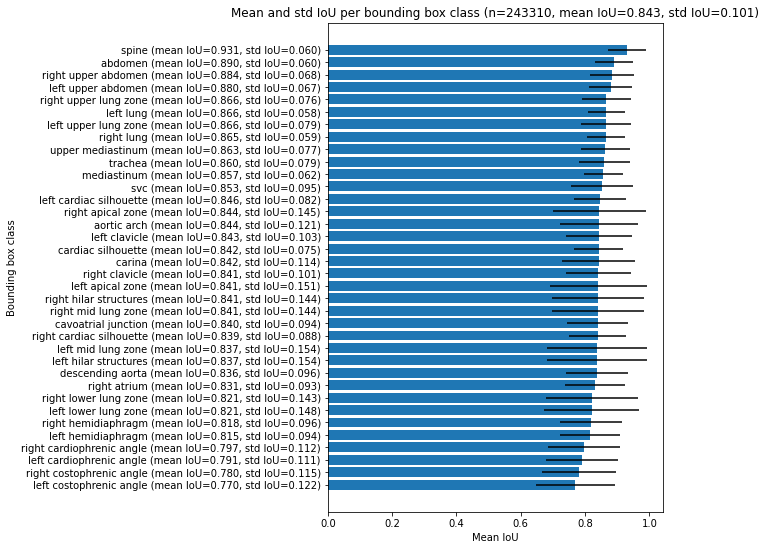

In [857]:
plot_chest_imagenome_iou_mean_std_per_bbox_class(
    average_bbox_coords=average_bbox_coords,
    dicom_ids=bbox_dict.keys(),
)

# Inspecting anomalous bounding boxes (gold dataset)

In [77]:
import pandas as pd

In [78]:
df = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_bbox_coordinate_annotations_1000images.csv')

In [79]:
gold_dicom_ids = [x[:-4] for x in df.image_id.unique()]

In [80]:
len(gold_dicom_ids)

1000

In [81]:
dicom_ids = gold_dicom_ids
print('milestone 1')
pred_bbox_coords = np.expand_dims(average_bbox_coords, 0).repeat(len(dicom_ids), 0)
print('milestone 2')
pred_bbox_presences = np.ones((len(dicom_ids), 36))
print('milestone 3')
test_bbox_coords = [bbox_dict[x]['coords'] for x in dicom_ids]
print('milestone 4')
test_bbox_presences = [bbox_dict[x]['presence'] for x in dicom_ids]
print('milestone 5')

milestone 1
milestone 2
milestone 3
milestone 4
milestone 5


In [82]:
bbox_pred_visualizer_gold = ChestImagenomeBboxPredictionsVisualizer(
    data = dict(
        dicom_ids=dicom_ids,
        pred_bbox_coords=pred_bbox_coords,
        pred_bbox_presences=pred_bbox_presences,
        test_bbox_coords=test_bbox_coords,
        test_bbox_presences=test_bbox_presences,
    )
)

100%|██████████| 1000/1000 [00:00<00:00, 1738.93it/s]

Processed 1000 predictions
IoU mean: 0.8473, std: 0.0622


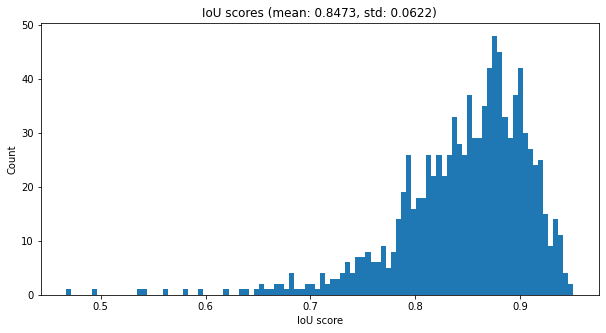

In [83]:
bbox_pred_visualizer_gold.plot_iou_scores(figsize=(10, 5))

In [84]:
bbox_pred_visualizer_gold.print_iou_scores_statistics()

IoU mean: 0.8473
IoU std: 0.0622
IoU min: 0.4671
IoU max: 0.9507
IoU <= 0.1: 0, cumulative: 0
0.1 < IoU <= 0.2: 0, cumulative: 0
0.2 < IoU <= 0.3: 0, cumulative: 0
0.3 < IoU <= 0.4: 0, cumulative: 0
0.4 < IoU <= 0.5: 2, cumulative: 2
0.5 < IoU <= 0.6: 5, cumulative: 7
0.6 < IoU <= 0.7: 21, cumulative: 28
0.7 < IoU <= 0.8: 158, cumulative: 186
0.8 < IoU <= 0.9: 632, cumulative: 818
0.9 < IoU <= 1.0: 182, cumulative: 1000


IoU score: 0.5386
DICOM ID: 8f37ff10-215cfeb7-6ef470af-46fa36a6-ddefdcb5
Predicted bounding box coordinates: [1.05148660e-01 1.22529661e-01 4.77127723e-01 7.74183709e-01
 1.72837049e-01 1.44388437e-01 4.73952769e-01 3.85893992e-01
 1.44196755e-01 3.87462546e-01 4.58187573e-01 5.28276827e-01
 1.06961788e-01 5.28367235e-01 4.45662707e-01 7.75880181e-01
 2.99972865e-01 3.57182180e-01 4.66738889e-01 5.54473949e-01
 2.12444605e-01 1.26029967e-01 4.72270263e-01 2.78598189e-01
 6.57005388e-02 6.89231841e-01 1.59519235e-01 7.85931552e-01
 3.34076246e-01 5.97290035e-01 3.95323313e-01 7.20443794e-01
 1.06374009e-01 6.27654638e-01 5.09149407e-01 7.81137524e-01
 5.20052471e-01 1.22679751e-01 8.93153191e-01 7.90403177e-01
 5.29212996e-01 1.45072918e-01 8.30667749e-01 3.85841090e-01
 5.32422735e-01 3.87077786e-01 8.58442465e-01 5.33856159e-01
 5.38682949e-01 5.33671096e-01 8.91221251e-01 7.91613565e-01
 5.25630127e-01 3.55670873e-01 6.94918134e-01 5.61248333e-01
 5.34310687e-01 1.26902879e-01 7.9397

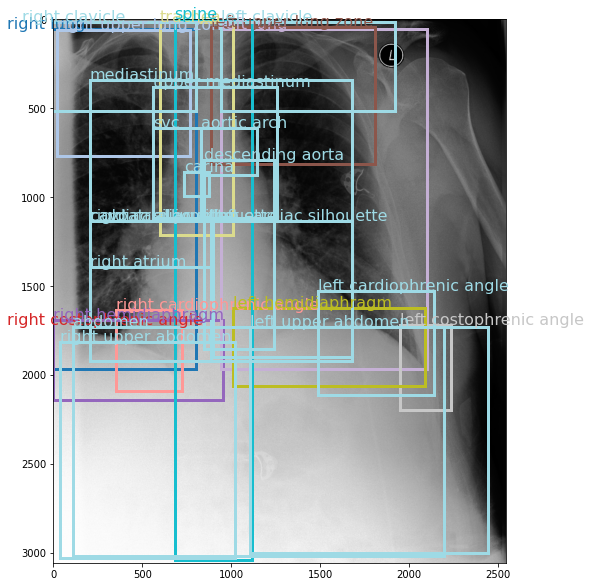

Image path: /mnt/data/mimic-cxr-jpg/images/p13/p13839087/s56679877/8f37ff10-215cfeb7-6ef470af-46fa36a6-ddefdcb5.jpg


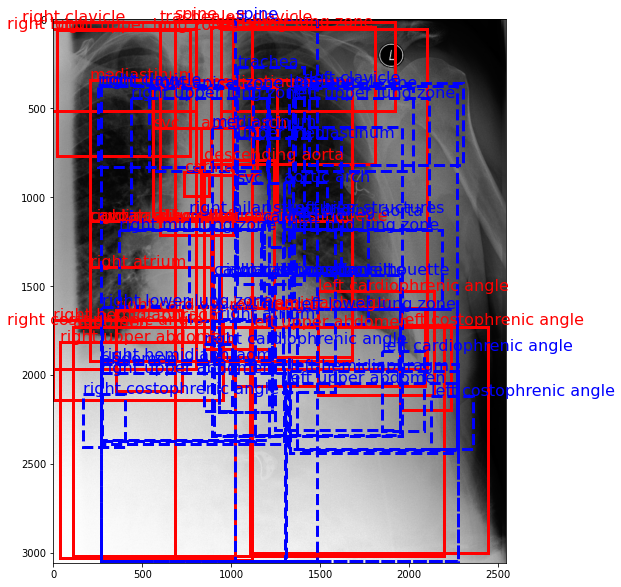

In [87]:
bbox_pred_visualizer_gold.visualize_bbox_predictions_example(2)

In [27]:
from importlib import reload
import medvqa

In [108]:
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)

<module 'medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management' from '/home/pamessina/medvqa/medvqa/datasets/chest_imagenome/chest_imagenome_dataset_management.py'>

In [122]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    load_chest_imagenome_gold_bboxes,
    visualize_predicted_bounding_boxes,
    get_chest_imagenome_gold_bbox_names,
)

In [123]:
gold_bboxes = load_chest_imagenome_gold_bboxes()

In [124]:
get_chest_imagenome_gold_bbox_names()

['aortic arch',
 'cardiac silhouette',
 'carina',
 'cavoatrial junction',
 'left apical zone',
 'left clavicle',
 'left costophrenic angle',
 'left hemidiaphragm',
 'left hilar structures',
 'left lower lung zone',
 'left lung',
 'left mid lung zone',
 'left upper lung zone',
 'right apical zone',
 'right atrium',
 'right clavicle',
 'right costophrenic angle',
 'right hemidiaphragm',
 'right hilar structures',
 'right lower lung zone',
 'right lung',
 'right mid lung zone',
 'right upper lung zone',
 'svc',
 'trachea',
 'upper mediastinum']

Image path: /mnt/data/mimic-cxr-jpg/images/p15/p15528228/s53078415/157febc5-ee2b7092-93d96d3d-3b125ac7-7e7795a0.jpg
Object: right lung (218.0, 313.0, 1037.0, 2060.0)
Object: right upper lung zone (341.0, 382.0, 914.0, 764.0)
Object: right mid lung zone (300.0, 1146.0, 873.0, 450.0)
Object: right lower lung zone (218.0, 1596.0, 928.0, 777.0)
Object: right hilar structures (736.0, 1050.0, 478.0, 628.0)
Object: right apical zone (477.0, 313.0, 778.0, 437.0)
Object: right costophrenic angle (81.0, 2169.0, 273.0, 273.0)
Object: right hemidiaphragm (218.0, 1950.0, 1105.0, 423.0)
Object: left lung (1377.0, 300.0, 915.0, 2142.0)
Object: left upper lung zone (1377.0, 368.0, 874.0, 778.0)
Object: left mid lung zone (1377.0, 1146.0, 887.0, 463.0)
Object: left lower lung zone (1405.0, 1609.0, 887.0, 833.0)
Object: left hilar structures (1377.0, 1050.0, 437.0, 641.0)
Object: left apical zone (1391.0, 300.0, 723.0, 450.0)
Object: left costophrenic angle (2155.0, 2237.0, 273.0, 273.0)
Object: left he

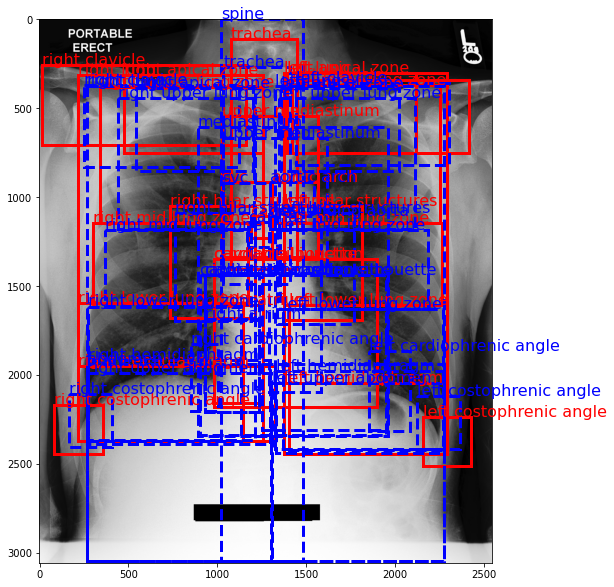

In [129]:
# dicom_id = gold_dicom_ids[-1]
dicom_id = '157febc5-ee2b7092-93d96d3d-3b125ac7-7e7795a0'
visualize_predicted_bounding_boxes(
    dicom_id=dicom_id,
    pred_coords=average_bbox_coords,
    pred_presence=[1] * 36,
    gt_coords=gold_bboxes[dicom_id]['coords'],
    gt_presence=gold_bboxes[dicom_id]['presence'],
    verbose=True,
)

In [24]:
gold_bboxes[dicom_id]['coords'][17:21], \
gold_bboxes[dicom_id]['presence'][17]

(array([0.45558176, 0.48658377, 0.6702044 , 0.18062827]), 1.0)

Computing IoU mean and std per bounding box class in parallel with 8 workers...
Done in 0.96 seconds


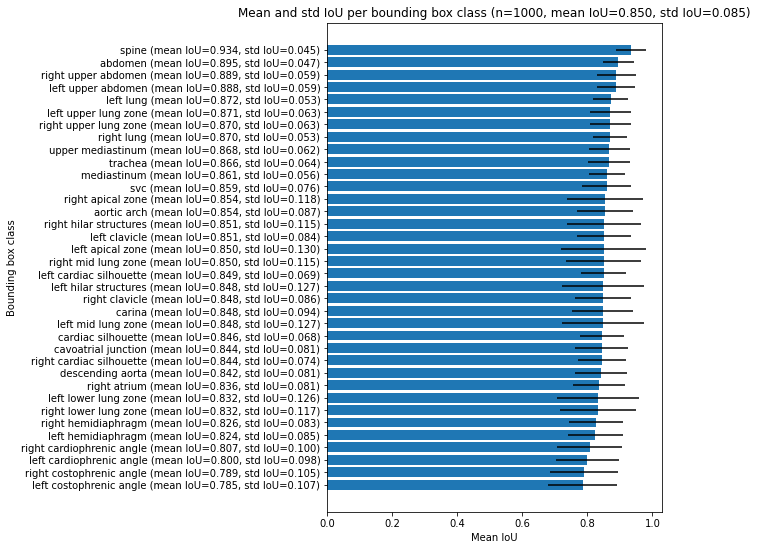

In [858]:
plot_chest_imagenome_iou_mean_std_per_bbox_class(
    average_bbox_coords=average_bbox_coords,
    dicom_ids=gold_bboxes.keys(),
)

# Inspecting label distribution

In [1]:
!python ../../scripts/chest_imagenome/precompute_silver_binary_labels.py --num_workers=10 --min_freq=0

Extracting labels from scene graphs
Labels loaded from cache (/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/raw_labels_from_scene_graphs.pkl)
Counting label frequencies
Filtering labels by frequency >= 0
Found 657 filtered (localized) labels
Found 79 non-localized labels
Found 736 labels in total
100%|█████████████████████████████████| 243310/243310 [01:04<00:00, 3756.91it/s]
Saving labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=0).pkl
Saving imageId2labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels(min_freq=0).pkl
Saving imageId2mask to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2mask(min_freq=0).pkl
Saving imageId2contradictions to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2contradictions(min_freq=0).pkl
Done


In [ ]:
!python ../../scripts/chest_imagenome/precompute_silver_binary_labels.py --num_workers=10 --min_freq=100

In [227]:
!python ../../scripts/chest_imagenome/precompute_silver_binary_labels.py --num_workers=10 --min_freq=500

Extracting labels from scene graphs
Labels loaded from cache (/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/raw_labels_from_scene_graphs.pkl)
Counting label frequencies
Filtering labels by frequency >= 500
Found 399 filtered (localized) labels
Found 70 non-localized labels
Found 469 labels in total
100%|█████████████████████████████████| 243310/243310 [00:32<00:00, 7514.53it/s]
Saving labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=500).pkl
Saving imageId2labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels(min_freq=500).pkl
Saving imageId2mask to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2mask(min_freq=500).pkl
Saving imageId2contradictions to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2contradictions(min_freq=500).pkl
Done


In [228]:
!python ../../scripts/chest_imagenome/precompute_silver_binary_labels.py --num_workers=10 --min_freq=1000

Extracting labels from scene graphs
Labels loaded from cache (/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/raw_labels_from_scene_graphs.pkl)
Counting label frequencies
Filtering labels by frequency >= 1000
Found 314 filtered (localized) labels
Found 65 non-localized labels
Found 379 labels in total
100%|█████████████████████████████████| 243310/243310 [00:31<00:00, 7838.31it/s]
Saving labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=1000).pkl
Saving imageId2labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels(min_freq=1000).pkl
Saving imageId2mask to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2mask(min_freq=1000).pkl
Saving imageId2contradictions to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2contradictions(min_freq=1000).pkl
Done


In [119]:
from medvqa.utils.files import load_pickle

In [129]:
label_names = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=0).pkl')

In [130]:
len(label_names)

736

In [131]:
sum(1 for x in label_names if len(x) == 2), sum(1 for x in label_names if len(x) == 3)

(79, 657)

In [123]:
imageId2labels = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels(min_freq=0).pkl')

In [124]:
label_names[-1]

('tubesandlines', 'tracheostomy tube')

In [125]:
imageId2labels['8f37ff10-215cfeb7-6ef470af-46fa36a6-ddefdcb5'].shape

(736,)

In [126]:
from importlib import reload
import medvqa

In [94]:
reload(medvqa.datasets.data_inspection_utils)

<module 'medvqa.datasets.data_inspection_utils' from '/home/pamessina/medvqa/medvqa/datasets/data_inspection_utils.py'>

In [127]:
from medvqa.datasets.data_inspection_utils import (
    plot_chest_imagenome_localized_label_distribution,
    plot_chest_imagenome_nonlocalized_label_distribution,
    plot_chest_imagenome_localized_label_frequency_histogram,
    plot_chest_imagenome_nonlocalized_label_frequency_histogram,
)

Num nonlocalized labels: 79
Counting labels in parallel (10 workers)...
Done counting labels (4.8s)


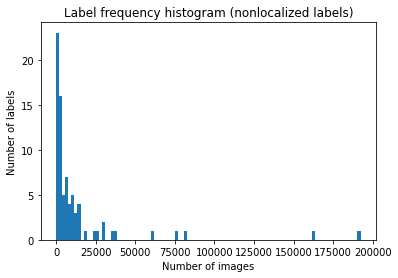

In [132]:
plot_chest_imagenome_nonlocalized_label_frequency_histogram(label_names, imageId2labels, figsize=(6,4))

Num localized labels: 657
Counting labels in parallel (10 workers)...
Done counting labels (35.6s)


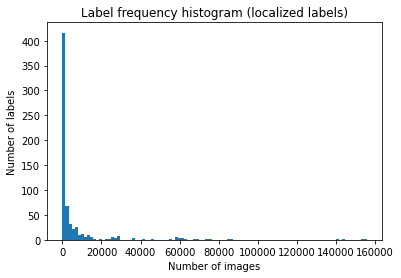

In [133]:
plot_chest_imagenome_localized_label_frequency_histogram(label_names, imageId2labels, figsize=(6,4))

Num nonlocalized labels: 79
Counting labels in parallel (10 workers)...
Done counting labels (5.4s)


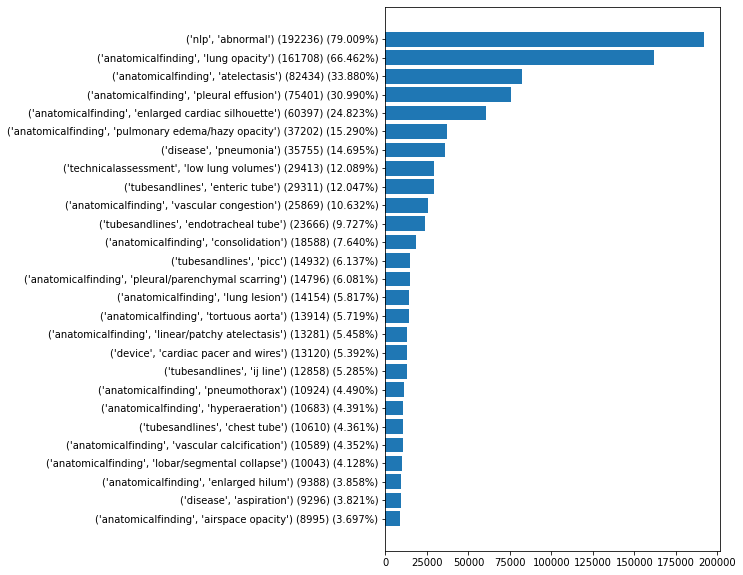

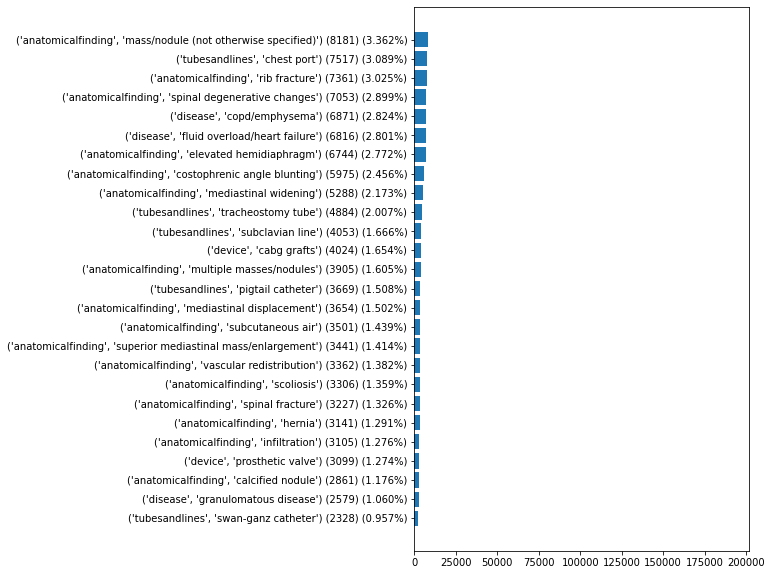

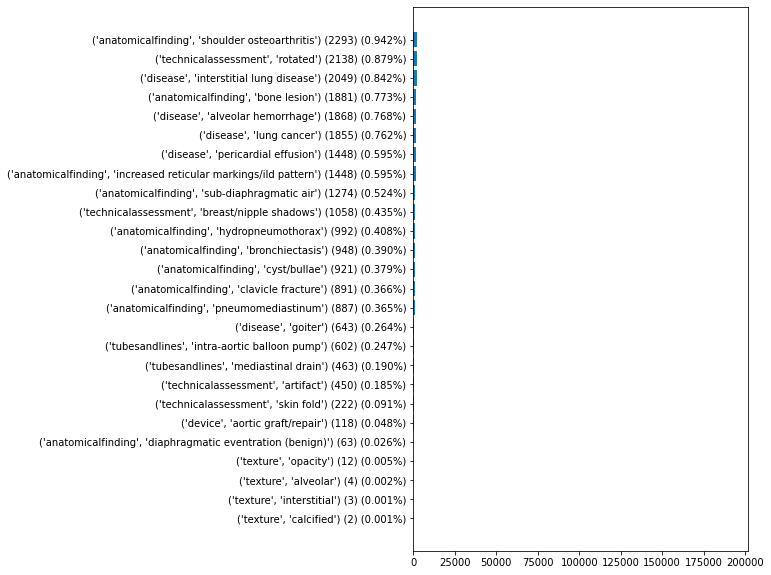

In [134]:
plot_chest_imagenome_nonlocalized_label_distribution(label_names, imageId2labels, figsize=(6,10))

Num localized labels: 657
Counting labels in parallel (10 workers)...
Done counting labels (38.3s)


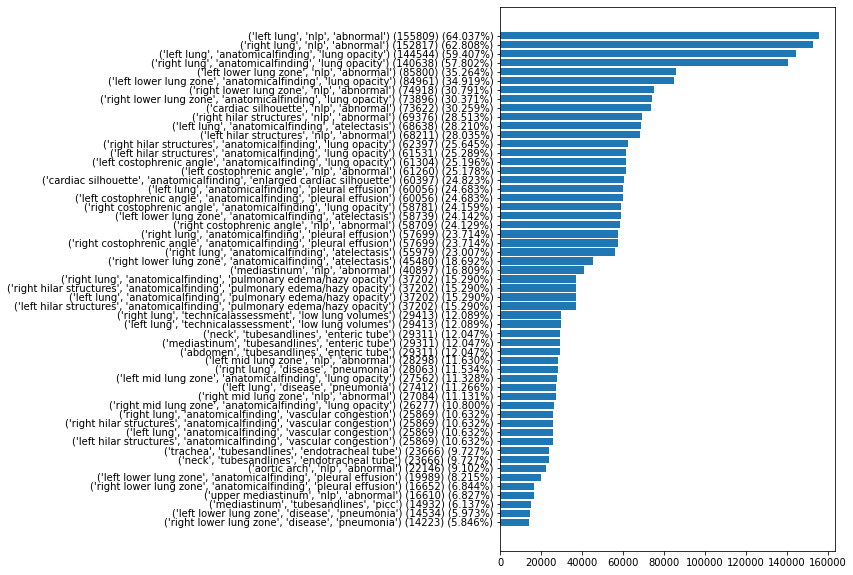

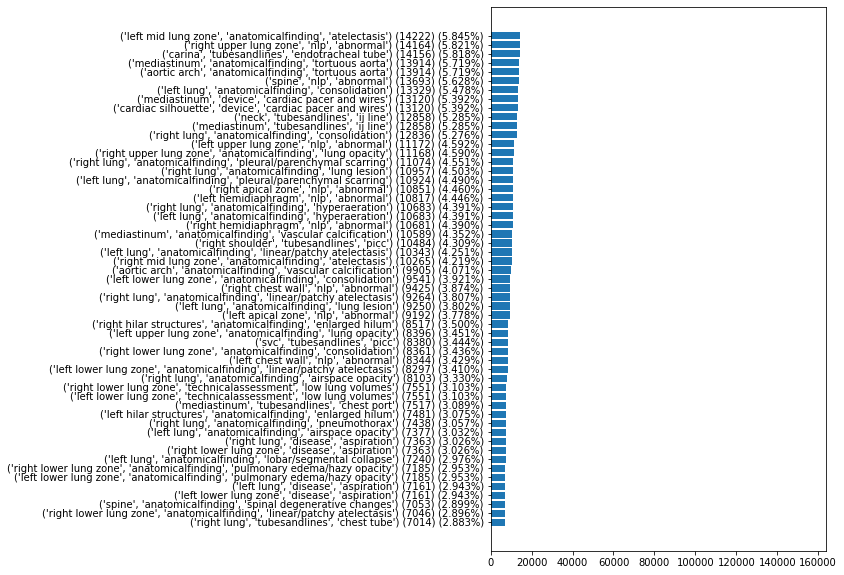

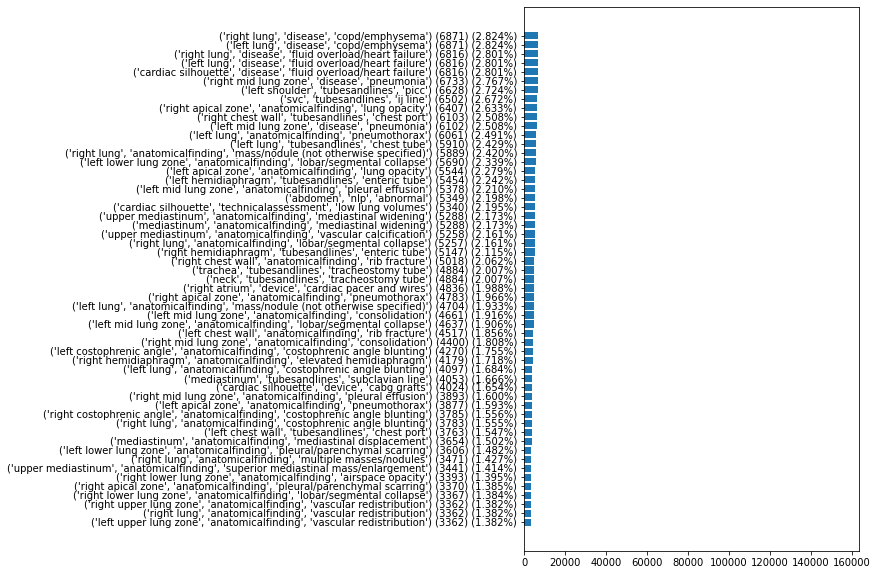

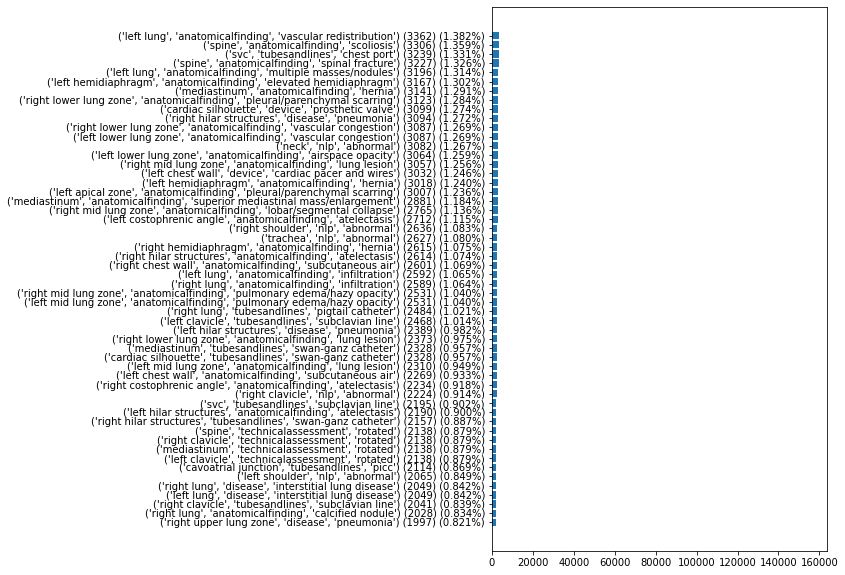

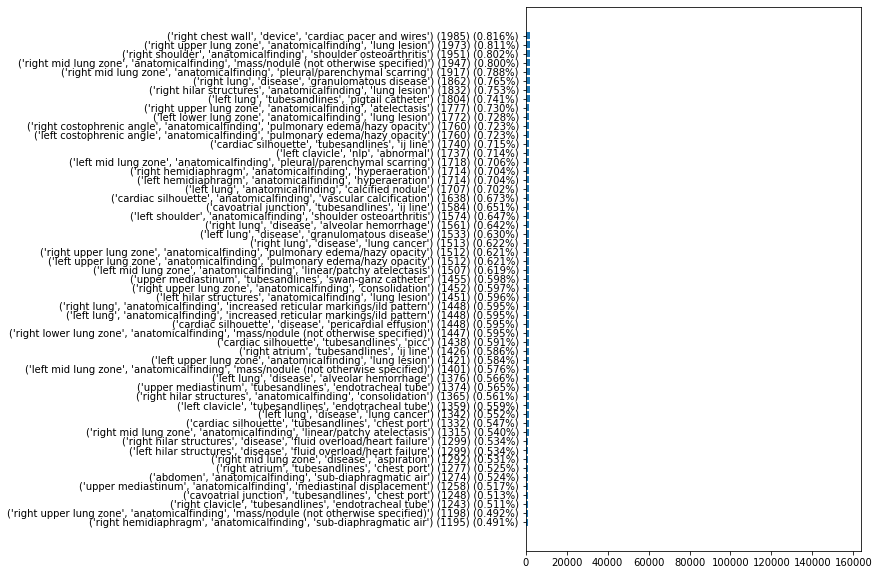

...

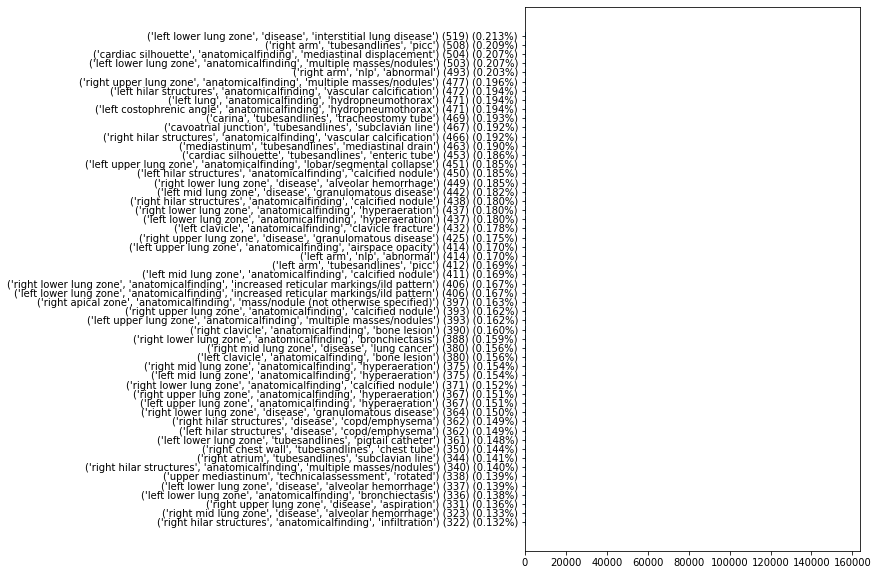

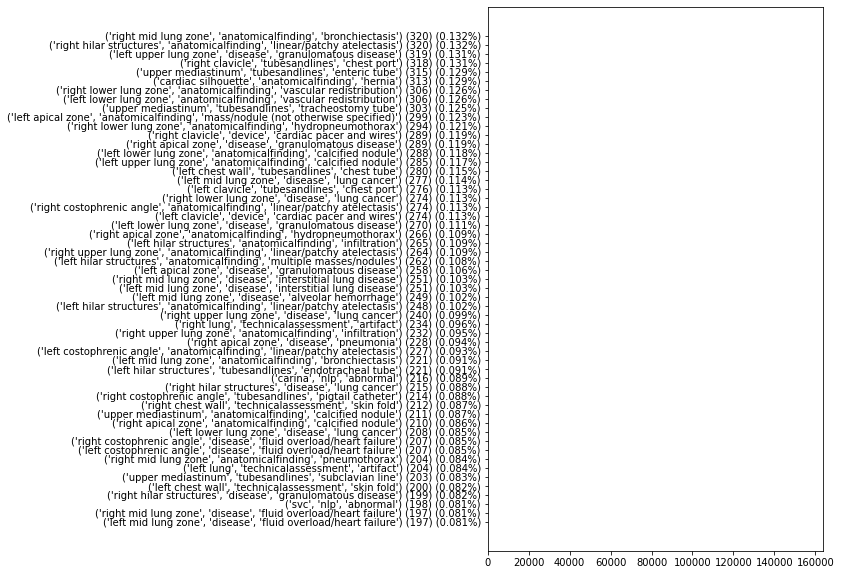

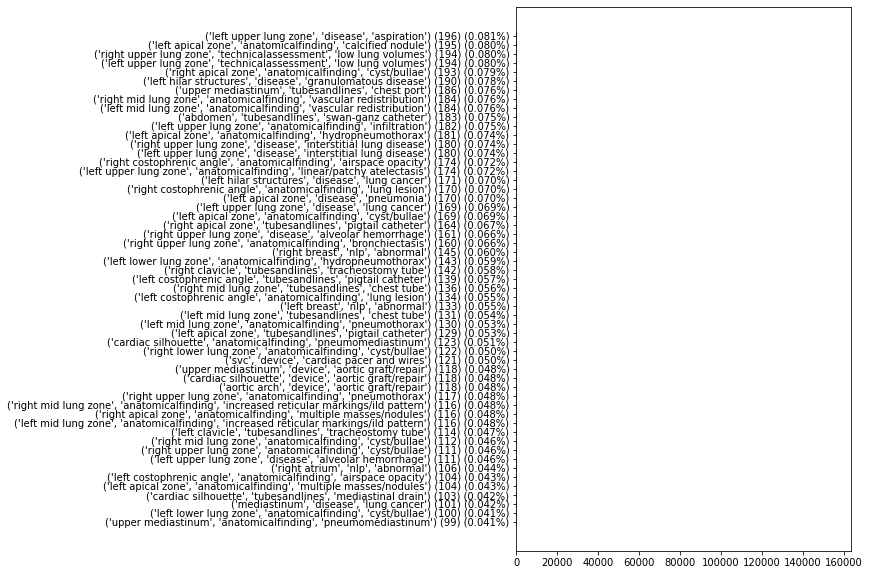

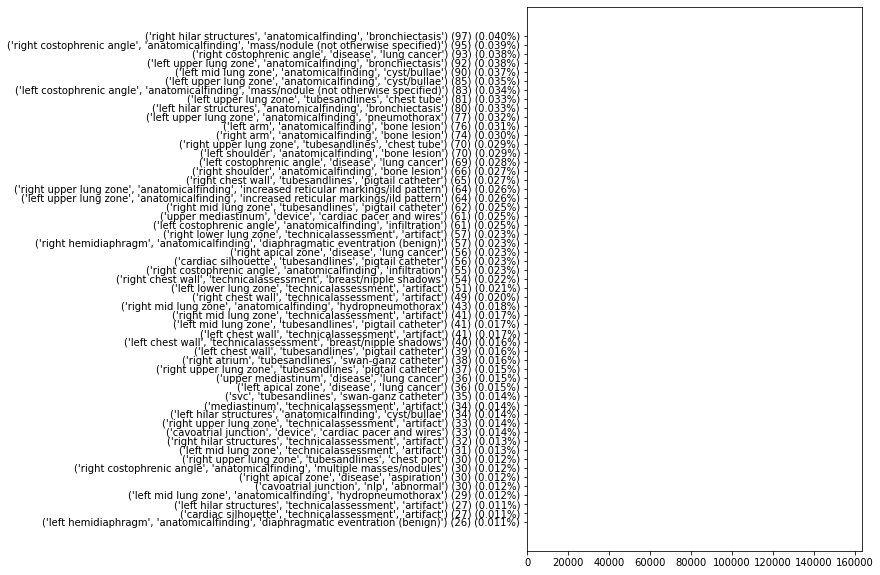

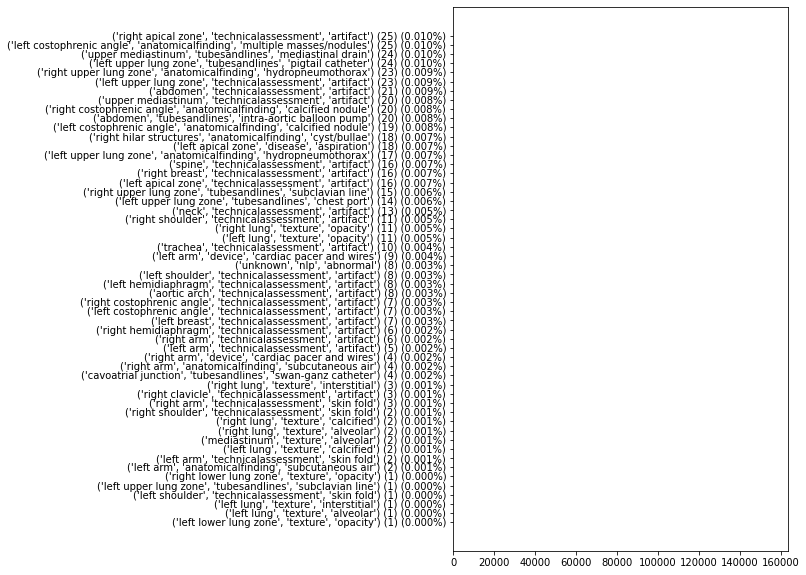

In [135]:
plot_chest_imagenome_localized_label_distribution(label_names, imageId2labels, figsize=(6,10), n_splits=12)

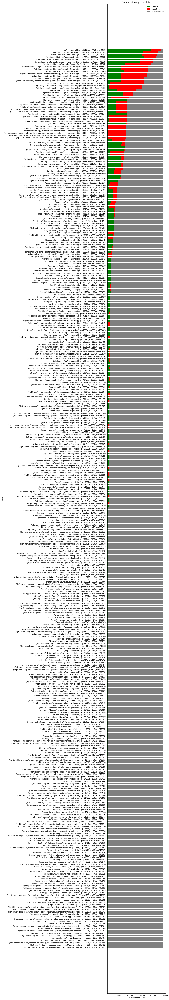

In [229]:
silver_label_names = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/labels(min_freq=1000).pkl')
silver_imageId2labels = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2labels(min_freq=1000).pkl')
silver_imageId2mask = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/imageId2mask(min_freq=1000).pkl')

plot_positive_negative_masked_distribution_per_label(
    label_names=silver_label_names,
    image_id_to_binary_labels=silver_imageId2labels,
    image_id_to_mask=silver_imageId2mask,
    figsize=(6, 80),
    num_workers=8,
)

# Estimating number of rotated images

In [801]:
reload(medvqa.datasets.chest_imagenome)
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)
reload(medvqa.datasets.mimiccxr)
reload(medvqa.datasets.data_inspection_utils)

<module 'medvqa.datasets.data_inspection_utils' from '/home/pamessina/medvqa/medvqa/datasets/data_inspection_utils.py'>

In [802]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    determine_if_image_is_rotated,
    determine_if_image_is_decent,
    visualize_ground_truth_bounding_boxes,
    visualize_symmetric_ground_truth_bounding_boxes,
    load_chest_imagenome_average_bbox_coords,
)

In [742]:
average_bbox_coords = load_chest_imagenome_average_bbox_coords()

Loading /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(clamped).pkl...


In [743]:
bbox_dict = load_chest_imagenome_silver_bboxes()

In [744]:
dicom_ids = list(bbox_dict.keys())

In [745]:
from tqdm import tqdm

In [746]:
rotated_dicom_ids = [None] * 300000
nonrotated_dicom_ids = [None] * 300000

i, j = 0, 0
for dicom_id in tqdm(dicom_ids):
    if determine_if_image_is_rotated(dicom_id, average_bbox_coords):
        rotated_dicom_ids[i] = dicom_id
        i += 1
    else:
        nonrotated_dicom_ids[j] = dicom_id
        j += 1
rotated_dicom_ids = rotated_dicom_ids[:i]
nonrotated_dicom_ids = nonrotated_dicom_ids[:j]

100%|██████████| 243310/243310 [01:06<00:00, 3643.65it/s]


In [747]:
len(rotated_dicom_ids), len(nonrotated_dicom_ids)

(55, 243255)

In [564]:
import random

In [735]:
determine_if_image_is_rotated(tmp, average_bbox_coords, debug=True)

Image path: /mnt/data/mimic-cxr-jpg/images/p19/p19931382/s50437364/2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb.jpg
Image size: 2544 x 3056
Image ID: 2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb
bbox: {'coords': array([0.00511006, 0.09816754, 0.7881289 , 0.48658377, 0.514544  ,
       0.1783377 , 0.7826258 , 0.48658377, 0.2841981 , 0.15608639,
       0.514544  , 0.48200262, 0.01572327, 0.10700262, 0.2841981 ,
       0.47742146, 0.2197327 , 0.325589  , 0.5735063 , 0.48200262,
       0.6540881 , 0.23658377, 0.8042453 , 0.49541885, 0.01061321,
       0.07133508, 0.09630504, 0.21400523, 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.00511006, 0.53992146, 0.7775157 , 0.9463351 ,
       0.5255503 , 0.5445026 , 0.7775157 , 0.8167539 , 0.30542454,
       0.5847513 , 0.5255503 , 0.875     , 0.00511006, 0.5445026 ,
       0.30031446, 0.9283377 , 0.2519654 , 0.59816754, 0.5683962 ,
       0.74541885, 0.6595912 , 0.575589  , 0.777515

True

In [733]:
'2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb' in rotated_dicom_ids

True

361f1f27-66356307-5576edf2-701b4767-dd5648fa
Image path: /mnt/data/mimic-cxr-jpg/images/p16/p16474790/s53794517/361f1f27-66356307-5576edf2-701b4767-dd5648fa.jpg


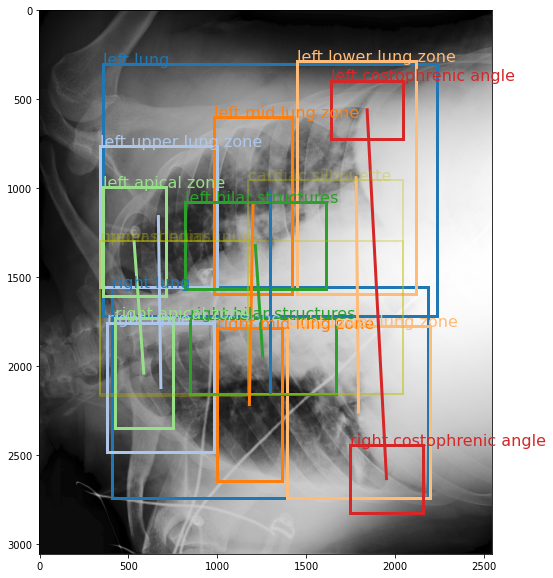

In [907]:
tmp = random.choice(rotated_dicom_ids)
# tmp = '2282cced-887d5d3a-fe6161b0-d462c06a-47c5d8bb'
print(tmp)
visualize_symmetric_ground_truth_bounding_boxes(tmp)

In [749]:
rotated_dicom_ids

['2f851df4-5a13e9aa-c3451d6c-774c30f9-3cad3a73',
 '1c23d5bb-74dcd9c5-17058ff6-7e5ea479-1836f6f3',
 '5adb8dc5-cc0be2b2-f5d5f0bb-4a9d8751-64970b13',
 'e3eebef6-25f36607-895cfdb8-8c959f45-c4730d39',
 '165393b5-58aff766-8a716e2a-ff649d76-90a226aa',
 '53e9fec7-54108334-80afb4e1-2ea1e6d1-31600601',
 '8f563a7f-df38edef-285cecd1-d7d175c7-238ec500',
 '3cbe8a21-bee465ac-a579e711-4798f2ae-32ca4068',
 'ad00f920-a3e75275-48185a74-9ebb4d82-aef4ec56',
 'd69217d9-014706e5-853d99c2-54c6694c-4e9b8e40',
 'c11e4f57-cc066d7b-56effe67-d5aae55a-be70c451',
 'd65a54bc-131b5f8d-d15389a5-b1006b85-a2801890',
 '9bd4b6c8-be7505d6-bcbcc047-fb55368f-c47970ca',
 '5da4947f-f9510c86-6c5e729b-2a7a42d9-931e9bec',
 'dda93b1d-a46878b6-061de285-83af5627-06d351df',
 'fb865cf1-f1f4a262-9154cbdd-76c5f843-aabb48df',
 '693dd63b-c9b9d3c4-2e9e1b46-b9d80f59-49bb0bcf',
 '598683ef-9a7f1dd0-234f3be5-453eed27-23132a1d',
 '361f1f27-66356307-5576edf2-701b4767-dd5648fa',
 'b5f4b672-358fd4e5-1f44c626-268c8c87-0b438ab1',
 '8bd72ea4-f6e5470f-

In [750]:
from medvqa.datasets.data_inspection_utils import plot_chest_imagenome_iou_histogram

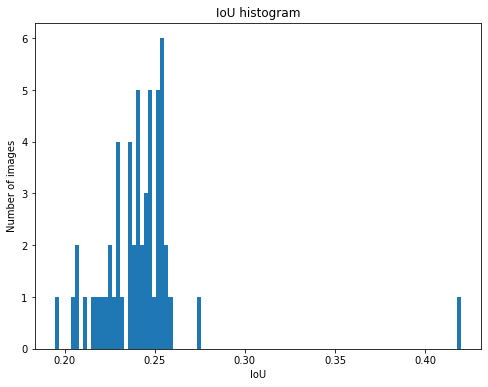

In [751]:
output = plot_chest_imagenome_iou_histogram(average_bbox_coords, rotated_dicom_ids, return_iou=True)

# Estimating number of "decent" images

In [773]:
decent_dicom_ids = [None] * 300000
nondecent_dicom_ids = [None] * 300000
i, j = 0, 0
for dicom_id in tqdm(dicom_ids):
    if determine_if_image_is_decent(dicom_id, average_bbox_coords):
        decent_dicom_ids[i] = dicom_id
        i += 1
    else:
        nondecent_dicom_ids[j] = dicom_id
        j += 1
decent_dicom_ids = decent_dicom_ids[:i]
nondecent_dicom_ids = nondecent_dicom_ids[:j]

100%|██████████| 243310/243310 [01:07<00:00, 3623.51it/s]


In [920]:
len(decent_dicom_ids), len(nondecent_dicom_ids),\
len(nondecent_dicom_ids) / (len(nondecent_dicom_ids) + len(decent_dicom_ids)) * 100

(242280, 1030, 0.4233282643541162)

In [780]:
determine_if_image_is_decent(tmp, average_bbox_coords, debug=True)

Image path: /mnt/data/mimic-cxr-jpg/images/p17/p17757235/s52979157/6c4bad25-005ab16f-df23a9a3-a6d581df-8b8db4cc.jpg
Image size: 2539 x 2870
Image ID: 6c4bad25-005ab16f-df23a9a3-a6d581df-8b8db4cc
bbox: {'coords': array([0.13588026, 0.22299652, 0.5699094 , 0.65609753, 0.19141394,
       0.24529617, 0.5699094 , 0.45087108, 0.15636078, 0.45087108,
       0.51949584, 0.52648085, 0.13588026, 0.52648085, 0.48444268,
       0.65609753, 0.33792832, 0.4327526 , 0.54470265, 0.5400697 ,
       0.19141394, 0.22299652, 0.5699094 , 0.4641115 , 0.13588026,
       0.52648085, 0.23710123, 0.6160279 , 0.37810162, 0.5400697 ,
       0.38834187, 0.5801394 , 0.13588026, 0.5445993 , 0.5699094 ,
       0.65609753, 0.38322175, 0.3303136 , 0.8625443 , 0.8212544 ,
       0.5852698 , 0.34808362, 0.8625443 , 0.5533101 , 0.38322175,
       0.5533101 , 0.8625443 , 0.65156794, 0.40842852, 0.65156794,
       0.8475778 , 0.8212544 , 0.38322175, 0.53101045, 0.62032294,
       0.669338  , 0.60535645, 0.3303136 , 0.842457

False

c7cc89fb-b5812aba-891ebe87-0ebc1ee5-cbb2846d
Image path: /mnt/data/mimic-cxr-jpg/images/p18/p18268241/s56221290/c7cc89fb-b5812aba-891ebe87-0ebc1ee5-cbb2846d.jpg


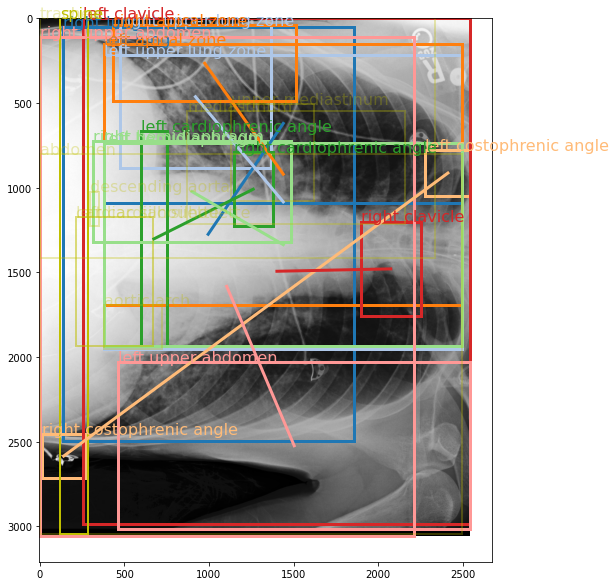

In [919]:
# tmp = nondecent_dicom_ids[2]
tmp = random.choice(nondecent_dicom_ids)
# tmp = 'b128a59a-4eb90799-c8564692-8e582714-82706ad2'
print(tmp)
visualize_symmetric_ground_truth_bounding_boxes(tmp)

ca6505a4-d6833670-9620156e-c3c11cab-b5b2ee10
Image path: /mnt/data/mimic-cxr-jpg/images/p19/p19720850/s59436446/ca6505a4-d6833670-9620156e-c3c11cab-b5b2ee10.jpg


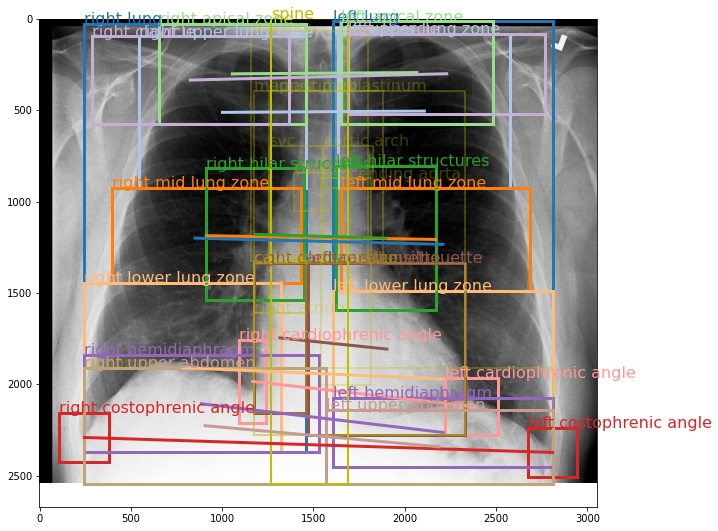

In [914]:
# tmp = nondecent_dicom_ids[2]
tmp = random.choice(decent_dicom_ids)
print(tmp)
visualize_symmetric_ground_truth_bounding_boxes(tmp)

In [784]:
gold_dicom_ids = list(gold_bboxes.keys())

In [785]:
set(nondecent_dicom_ids) & set(gold_dicom_ids)

set()

In [786]:
from medvqa.datasets.mimiccxr import get_mimimiccxr_test_dicom_ids

In [787]:
mimiccxr_test_dicom_ids = get_mimimiccxr_test_dicom_ids()

In [788]:
len(set(nondecent_dicom_ids) & set(mimiccxr_test_dicom_ids))

14

In [789]:
set(nondecent_dicom_ids) & set(mimiccxr_test_dicom_ids)

{'1fe087b5-76e46847-985f4986-3046404a-2184844a',
 '399fb314-aac34ecd-b7b71a40-3b2ac5e3-9dcdaa7a',
 '3f0f5cbb-59b29982-c936c70b-36a6c86d-23da1915',
 '53b32671-685e3433-612784a3-6c684cd8-e06dd901',
 '5adb8dc5-cc0be2b2-f5d5f0bb-4a9d8751-64970b13',
 '5bc36095-67e87f3e-58bd0b18-96e0fc83-eec8c80a',
 '9aa3498d-70f8a9a5-132f5a2b-bb7c2837-2653ee2d',
 'aac431c4-71ce2760-10747748-4fd37654-0f440dd6',
 'b128a59a-4eb90799-c8564692-8e582714-82706ad2',
 'b2b5a3a4-24b4dc24-84c9e1a5-98f8a217-8c89ba2a',
 'bf010702-69e984da-d0e9d988-cb6dbed8-1f759220',
 'd59037ae-76814c45-ab38e8da-7b58f204-debaa6b9',
 'dedc8034-9860140a-df88abb0-b9b2fab5-3265641f',
 'ecd3a847-44218ca9-e9039305-57d97776-45c6a231'}

# Checking horizontal flip data augmentation

In [21]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    load_chest_imagenome_silver_bboxes,
    load_chest_imagenome_horizontally_flipped_silver_bboxes,    
    visualize_symmetric_ground_truth_bounding_boxes,        
)
import medvqa
import random
from importlib import reload

In [16]:
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)

<module 'medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management' from '/home/pamessina/medvqa/medvqa/datasets/chest_imagenome/chest_imagenome_dataset_management.py'>

In [22]:
bbox_dict = load_chest_imagenome_silver_bboxes()

In [2]:
hflipped_bbox_dict = load_chest_imagenome_horizontally_flipped_silver_bboxes()

In [3]:
len(hflipped_bbox_dict)

243310

In [23]:
bbox_dict[dicom_id]

{'coords': array([ 0.16492146,  0.        ,  0.49541885,  0.6914308 ,  0.19633508,
         0.02672956,  0.49541885,  0.20361635,  0.1875    ,  0.20361635,
         0.48658377,  0.38050315,  0.16492146,  0.38050315,  0.46400523,
         0.6914308 ,  0.3347513 ,  0.1658805 ,  0.4908377 ,  0.41273585,
         0.20975131,  0.        ,  0.49541885,  0.11792453,  0.12041885,
         0.6112421 ,  0.20975131,  0.7185535 ,  0.375     ,  0.49842766,
         0.4375    ,  0.6218553 ,  0.16492146,  0.5361635 ,  0.5533377 ,
         0.6914308 ,  0.5625    ,  0.        ,  0.90150523,  0.6540881 ,
         0.5625    ,  0.02672956,  0.8658377 ,  0.20361635,  0.5667539 ,
         0.20361635,  0.8838351 ,  0.36988994,  0.575589  ,  0.36988994,
         0.90150523,  0.6540881 ,  0.5625    ,  0.1658805 ,  0.72316754,
         0.40212265,  0.5625    ,  0.        ,  0.8347513 ,  0.11792453,
         0.825589  ,  0.5628931 ,  0.91492146,  0.6702044 ,  0.5625    ,
         0.5628931 ,  0.90150523,  0.6808

In [29]:
dicom_ids = list(hflipped_bbox_dict.keys())

Image path: /mnt/data/mimic-cxr-jpg/images/p17/p17340563/s51645404/35c93cd4-00640cc1-127a083c-824c0372-daf5a587.jpg


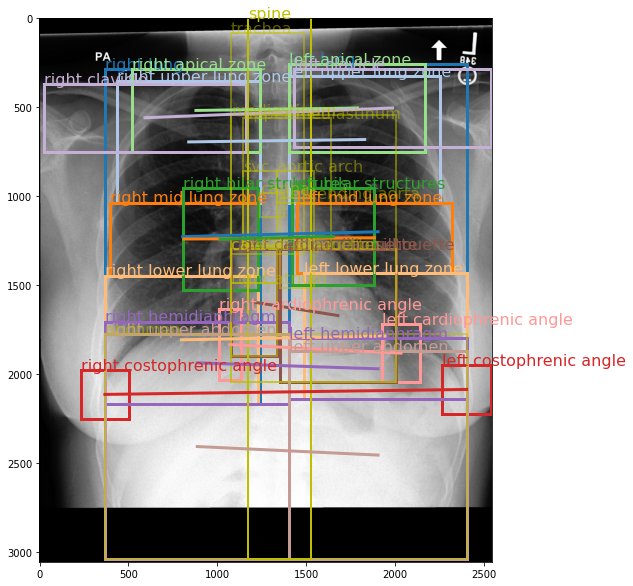

In [30]:
dicom_id = random.choice(dicom_ids)
# dicom_d = '585278b7-3bc1ed92-b7d8da88-77467882-73dd2289'
visualize_symmetric_ground_truth_bounding_boxes(dicom_id)

Flipped image
Image path: /mnt/data/mimic-cxr-jpg/images/p17/p17340563/s51645404/35c93cd4-00640cc1-127a083c-824c0372-daf5a587.jpg


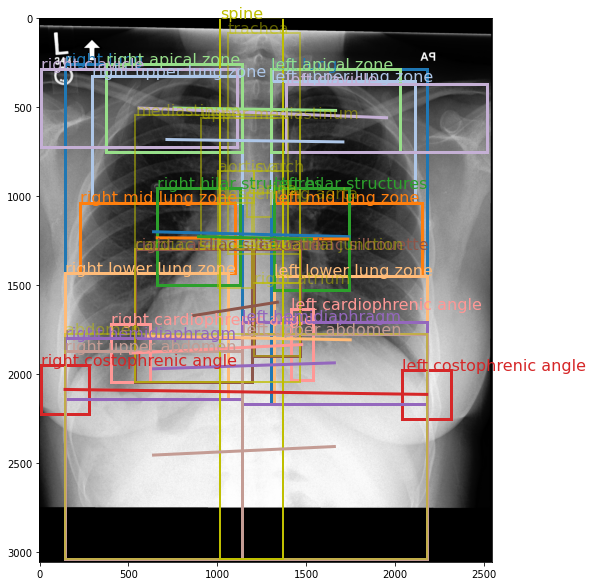

In [31]:
visualize_symmetric_ground_truth_bounding_boxes(dicom_id, flipped=True)

# Comparing silver and gold annotations

In [878]:
reload(medvqa.datasets.data_inspection_utils)

<module 'medvqa.datasets.data_inspection_utils' from '/home/pamessina/medvqa/medvqa/datasets/data_inspection_utils.py'>

In [879]:
from medvqa.datasets.data_inspection_utils import plot_chest_imagenome_silver_vs_gold_iou_per_bbox_class

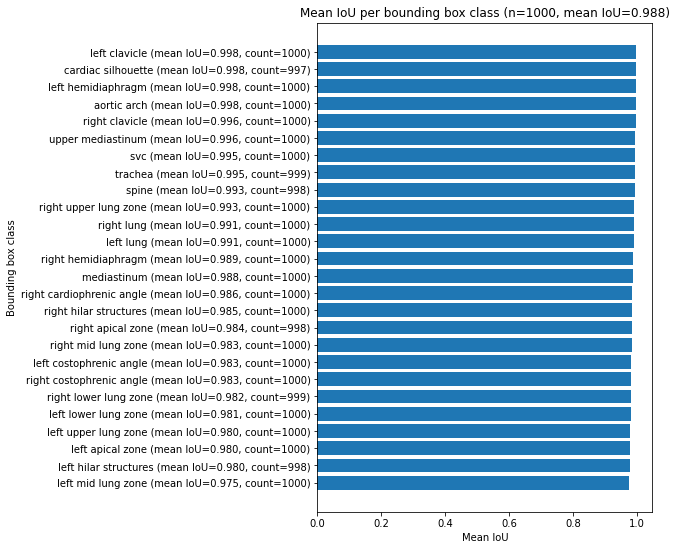

In [880]:
plot_chest_imagenome_silver_vs_gold_iou_per_bbox_class()

# Comparing different averages

In [896]:
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)

<module 'medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management' from '/home/pamessina/medvqa/medvqa/datasets/chest_imagenome/chest_imagenome_dataset_management.py'>

In [897]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    get_chest_imagenome_train_average_bbox_coords,
    load_chest_imagenome_dicom_ids,
)

In [884]:
unfiltered_avg = get_chest_imagenome_train_average_bbox_coords()

Loading /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(clamped).pkl...


In [885]:
filtered_avg = get_chest_imagenome_train_average_bbox_coords(use_decent_images_only=True)

Loading cached detailed metadata from /mnt/data/pamessina/workspaces/medvqa-workspace/cache/mimiccxr/detailed_metadata.pkl
Loading /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(clamped).pkl...
Skipped 1005 images
Saved /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(clamped)_decent_images_only(avg_coef_0.4_std_coef_0.5).pkl


In [894]:
np.abs(filtered_avg - unfiltered_avg).max()

0.0009439783498667031

In [898]:
unfiltered_dicom_ids = load_chest_imagenome_dicom_ids()

In [899]:
filtered_dicom_ids = load_chest_imagenome_dicom_ids(decent_images_only=True)

Loading /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/chest_imagenome_train_average_bbox_coords(clamped).pkl...


In [902]:
len(unfiltered_dicom_ids), len(filtered_dicom_ids), len(unfiltered_dicom_ids) - len(filtered_dicom_ids)

(243310, 242280, 1030)

# Exploring anatomy and label relations

In [1]:
from importlib import reload
import medvqa

In [40]:
reload(medvqa.datasets.chest_imagenome)
reload(medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management)

<module 'medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management' from '/home/pamessina/medvqa/medvqa/datasets/chest_imagenome/chest_imagenome_dataset_management.py'>

In [48]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import get_labels_per_anatomy_and_anatomy_group

In [49]:
label_names, anatomy_2_localized_labels, anatomy_group_2_global_labels = \
    get_labels_per_anatomy_and_anatomy_group('labels(min_freq=1000).pkl')

In [50]:
len(label_names)

379

In [52]:
len(anatomy_2_localized_labels)

36

In [53]:
anatomy_2_localized_labels

{'abdomen': [0, 1, 2],
 'aortic arch': [3, 4, 5, 6],
 'cardiac silhouette': [7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
 'carina': [21],
 'cavoatrial junction': [22, 23, 24],
 'left apical zone': [25, 26, 27, 28],
 'left breast': [29],
 'left chest wall': [30, 31, 32, 33, 34, 35],
 'left clavicle': [36, 37, 38, 39],
 'left costophrenic angle': [40, 41, 42, 43, 44, 45, 46],
 'left hemidiaphragm': [47, 48, 49, 50, 51, 52],
 'left hilar structures': [53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64],
 'left lower lung zone': [65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82],
 'left lung': [83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114],
 'left mid lung zone': [115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128],
 'left should

In [20]:
for ag, labels in anatomy_group_2_global_labels.items():
    print('-' * 80)
    print(len(ag))
    print(ag)    
    for l in labels:
        print('\t\t\t' + str(label_names[l]))

--------------------------------------------------------------------------------
7
('left lower lung zone', 'left lung', 'left mid lung zone', 'right hilar structures', 'right lower lung zone', 'right lung', 'right mid lung zone')
			('anatomicalfinding', 'airspace opacity')
--------------------------------------------------------------------------------
12
('left costophrenic angle', 'left hilar structures', 'left lower lung zone', 'left lung', 'left mid lung zone', 'left upper lung zone', 'right costophrenic angle', 'right hilar structures', 'right lower lung zone', 'right lung', 'right mid lung zone', 'right upper lung zone')
			('anatomicalfinding', 'atelectasis')
			('anatomicalfinding', 'pulmonary edema/hazy opacity')
--------------------------------------------------------------------------------
2
('left chest wall', 'right chest wall')
			('anatomicalfinding', 'bone lesion')
			('anatomicalfinding', 'rib fracture')
			('anatomicalfinding', 'subcutaneous air')
-----------------

In [9]:
sum(len(x) for x in anatomy_2_localized_labels.values())

314

In [10]:
union = set()
for x in anatomy_2_localized_labels.values():
    union.update(x)
len(union)

314

In [29]:
from medvqa.datasets.chest_imagenome import CHEST_IMAGENOME_BBOX_NAMES

In [31]:
len(set(anatomy_2_localized_labels.keys()) & set(CHEST_IMAGENOME_BBOX_NAMES))

29

In [32]:
set(anatomy_2_localized_labels.keys()) - set(CHEST_IMAGENOME_BBOX_NAMES)

{'left breast',
 'left chest wall',
 'left shoulder',
 'neck',
 'right breast',
 'right chest wall',
 'right shoulder'}

In [33]:
set(CHEST_IMAGENOME_BBOX_NAMES) - set(anatomy_2_localized_labels.keys())

{'descending aorta',
 'left cardiac silhouette',
 'left cardiophrenic angle',
 'left upper abdomen',
 'right cardiac silhouette',
 'right cardiophrenic angle',
 'right upper abdomen'}

In [54]:
tmp = get_labels_per_anatomy_and_anatomy_group('labels(min_freq=1000).pkl', for_training=True)

In [56]:
tmp.keys()

dict_keys(['anatomy_names', 'anatomy_2_localized_labels', 'anatomy_group_2_global_labels'])

In [57]:
len(tmp['anatomy_names'])

43

In [58]:
len(tmp['anatomy_2_localized_labels'])

36

In [61]:
len(tmp['anatomy_group_2_global_labels'])

44

# Inspecting Gold labels

In [62]:
!ls /mnt/data/chest-imagenome-v1.0.0/gold_dataset/

auto_bbox_pipeline_coordinates_1000_images.txt
bbox_coordinate_annotations_1_C.csv
bbox_coordinate_annotations_1_W.csv
bbox_coordinate_annotations_2_J.csv
bbox_coordinate_annotations_2_S.csv
final_merging_report_and_bbox_ground_truth.ipynb
gold_all_sentences_500pts_1000studies.txt
gold_attributes_relations_500pts_500studies1st.txt
gold_baseline_object_attribute_with_coordinate.txt
gold_bbox_coordinate_annotations_1000images.csv
gold_bbox_scaling_factors_original_to_224x224.csv
gold_chf_object_comparison_with_coordinates.txt
gold_comparison_relations_500pts_500studies2nd.txt
gold_object_attribute_with_coordinates.txt
gold_object_comparison_with_coordinates.txt
index.html


In [63]:
!head /mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_attributes_relations_500pts_500studies1st.txt

In [67]:
import pandas as pd
df = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_attributes_relations_500pts_500studies1st.txt', sep='\t')

In [68]:
df

,patient_id,study_id,image_id,row_id,section,bbox,relation,label_name,context,categoryID,region,annot_id,sentence,object_id
0,10020740,55522869,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484.dcm,55522869|5,finalreport,carina,1,endotracheal tube,yes,tubesandlines,"['carina', 'neck', 'trachea']",55522869|5|carina|1|endotracheal tube,There is an endotracheal tube in place with it...,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484_c...
1,10020740,55522869,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484.dcm,55522869|5,finalreport,neck,1,endotracheal tube,yes,tubesandlines,"['carina', 'neck', 'trachea']",55522869|5|neck|1|endotracheal tube,There is an endotracheal tube in place with it...,NaN
2,10020740,55522869,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484.dcm,55522869|5,finalreport,trachea,1,endotracheal tube,yes,tubesandlines,"['carina', 'neck', 'trachea']",55522869|5|trachea|1|endotracheal tube,There is an endotracheal tube in place with it...,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484_t...
3,10020740,55522869,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484.dcm,55522869|6,finalreport,abdomen,1,enteric tube,yes,tubesandlines,"['abdomen', 'mediastinum', 'neck']",55522869|6|abdomen|1|enteric tube,Nasogastric tube extends well into the stomach.,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484_a...
4,10020740,55522869,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484.dcm,55522869|6,finalreport,mediastinum,1,enteric tube,yes,tubesandlines,"['abdomen', 'mediastinum', 'neck']",55522869|6|mediastinum|1|enteric tube,Nasogastric tube extends well into the stomach.,27776756-1d9ef4fc-cd8dd0ca-1453072f-12c0f484_m...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21589,19998497,50311574,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a.dcm,50311574|9,finalreport,right hilar structures,1,vascular congestion,yes,anatomicalfinding,"['cardiac silhouette', 'cardiac silhouette', '...",50311574|9|right hilar structures|1|vascular c...,prominence of pulmonary vasculature and diffu...,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a_r...
21590,19998497,50311574,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a.dcm,50311574|9,finalreport,right lung,1,abnormal,yes,nlp,"['cardiac silhouette', 'left lung', 'right lung']",50311574|9|right lung|1|abnormal,Prominence of pulmonary vasculature and diffus...,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a_r...
21591,19998497,50311574,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a.dcm,50311574|9,finalreport,right lung,1,fluid overload/heart failure,yes,disease,"['cardiac silhouette', 'left lung', 'right lung']",50311574|9|right lung|1|fluid overload/heart f...,Prominence of pulmonary vasculature and diffus...,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a_r...
21592,19998497,50311574,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a.dcm,50311574|9,finalreport,right lung,1,lung opacity,yes,anatomicalfinding,"['cardiac silhouette', 'left lung', 'right lung']",50311574|9|right lung|1|lung opacity,Prominence of pulmonary vasculature and diffus...,53a6e508-c64868f0-cea054db-f7610b25-ef5fb32a_r...


In [73]:
len(df['image_id'].unique())

500

In [70]:
df2 = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_object_attribute_with_coordinates.txt', sep='\t')

In [75]:
len(df2['image_id'].unique())

500

In [76]:
df3 = pd.read_csv('/mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_comparison_relations_500pts_500studies2nd.txt', sep='\t')

In [77]:
df3

,patient_id,study_id,studyOrder,image_id,row_id,section,bbox,relation,label_name,context,categoryID,region,annot_id,sentence,comparison
0,10020740,58116104,2,d3dbb519-1ea6cf3c-bb4c1fd8-79bb117a-1dc3869f.dcm,58116104|5,finalreport,left lung,1.0,low lung volumes,yes,technicalassessment,"['left lung', 'right lung']",58116104|5|left lung|1|low lung volumes,"as compared to the previous radiograph, the l...",['no change']
1,10020740,58116104,2,d3dbb519-1ea6cf3c-bb4c1fd8-79bb117a-1dc3869f.dcm,58116104|5,finalreport,right lung,1.0,low lung volumes,yes,technicalassessment,"['left lung', 'right lung']",58116104|5|right lung|1|low lung volumes,"as compared to the previous radiograph, the l...",['no change']
2,10020740,58116104,2,d3dbb519-1ea6cf3c-bb4c1fd8-79bb117a-1dc3869f.dcm,58116104|9,finalreport,left costophrenic angle,0.0,pleural effusion,no,anatomicalfinding,"['left costophrenic angle', 'left lung', 'righ...",58116104|9|left costophrenic angle|0|pleural e...,no larger pleural effusions,['no change']
3,10020740,58116104,2,d3dbb519-1ea6cf3c-bb4c1fd8-79bb117a-1dc3869f.dcm,58116104|9,finalreport,left lung,0.0,pleural effusion,no,anatomicalfinding,"['left costophrenic angle', 'left lung', 'righ...",58116104|9|left lung|0|pleural effusion,no larger pleural effusions,['no change']
4,10020740,58116104,2,d3dbb519-1ea6cf3c-bb4c1fd8-79bb117a-1dc3869f.dcm,58116104|9,finalreport,right costophrenic angle,1.0,abnormal,yes,nlp,"['left costophrenic angle', 'left lung', 'righ...",58116104|9|right costophrenic angle|1|abnormal,no larger pleural effusions,['no change']
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5428,19969031,50515411,2,9aaba37f-76c7ea79-5b725634-d63275b5-018254ab.dcm,50515411|4,finalreport,right upper lung zone,1.0,atelectasis,yes,nlp,"['mediastinum', 'mediastinum', 'right chest wa...",50515411|4|right upper lung zone|1|atelectasis,again seen are signs of volume loss in the ri...,['no change']
5429,19969031,50515411,2,9aaba37f-76c7ea79-5b725634-d63275b5-018254ab.dcm,50515411|4,finalreport,right lung,1.0,lung opacity,yes,nlp,"['mediastinum', 'mediastinum', 'right chest wa...",50515411|4|right lung|1|lung opacity,again seen are signs of volume loss in the ri...,['no change']
5430,19969031,50515411,2,9aaba37f-76c7ea79-5b725634-d63275b5-018254ab.dcm,50515411|4,finalreport,right upper lung zone,1.0,lung opacity,yes,nlp,"['mediastinum', 'mediastinum', 'right chest wa...",50515411|4|right upper lung zone|1|lung opacity,again seen are signs of volume loss in the ri...,['no change']
5431,19969031,50515411,2,9aaba37f-76c7ea79-5b725634-d63275b5-018254ab.dcm,50515411|8,finalreport,right clavicle,1.0,abnormal,yes,nlp,"['right clavicle', 'right clavicle']",50515411|8|right clavicle|1|abnormal,nonunion of an old right clavicular fracture ...,['no change']


In [198]:
!python ../../scripts/chest_imagenome/precompute_gold_binary_labels.py

Reading /mnt/data/chest-imagenome-v1.0.0/gold_dataset/gold_attributes_relations_500pts_500studies1st.txt
21594it [00:00, 627824.19it/s]
Found 430 localized labels
Found 69 global labels
Found 499 total labels
100%|███████████████████████████████████████| 500/500 [00:00<00:00, 8123.30it/s]
Saving labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_binary_labels.pkl
Saving imageId2labels to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2binaryLabels.pkl
Saving imageId2mask to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2mask.pkl
Saving imageId2contradictions to /mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2contradictions.pkl
Done


In [230]:
reload(medvqa.datasets.data_inspection_utils)

<module 'medvqa.datasets.data_inspection_utils' from '/home/pamessina/medvqa/medvqa/datasets/data_inspection_utils.py'>

In [231]:
from medvqa.datasets.data_inspection_utils import (
    plot_chest_imagenome_localized_label_distribution,
    plot_chest_imagenome_nonlocalized_label_distribution,
    print_number_of_contradictions_per_class,
    collect_dicom_ids_with_contradictions,
    plot_positive_negative_masked_distribution_per_label,
)
from medvqa.utils.files import load_pickle

In [158]:
gold_label_names = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_binary_labels.pkl')

In [200]:
gold_image_id_to_binary_labels = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2binaryLabels.pkl')

In [201]:
gold_image_id_to_contradictions = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2contradictions.pkl')

In [199]:
gold_image_id_to_mask = load_pickle('/mnt/data/pamessina/workspaces/medvqa-workspace/cache/chest_imagenome/gold_imageId2mask.pkl')

Num nonlocalized labels: 69
Counting labels in parallel (10 workers)...
Done counting labels (0.3s)


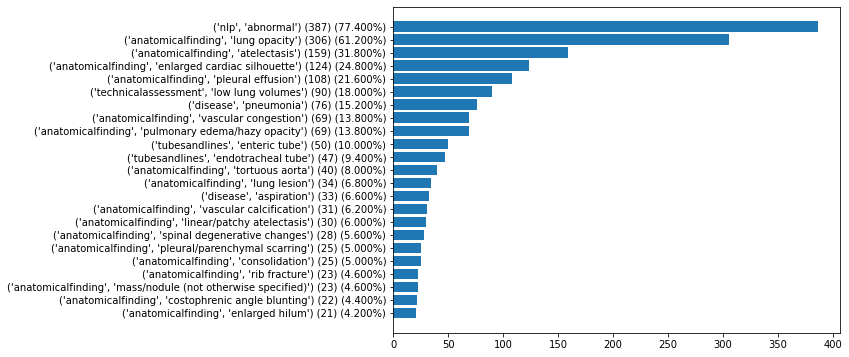

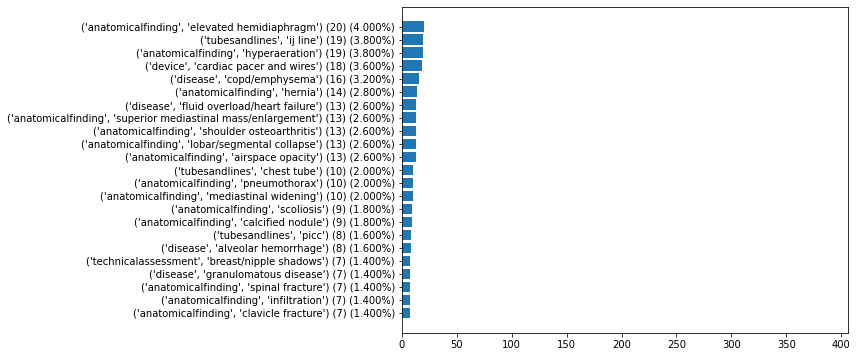

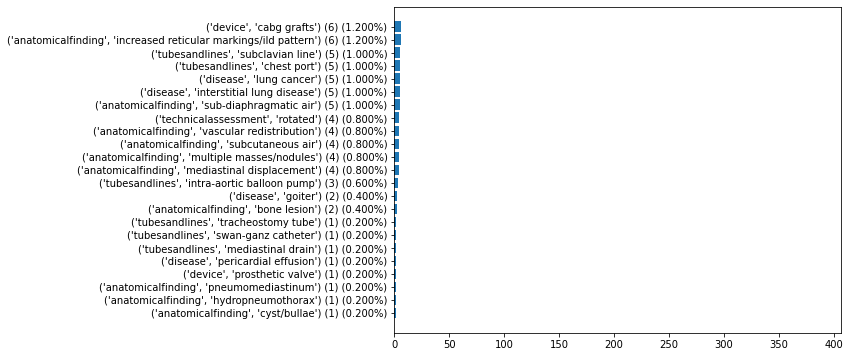

In [145]:
plot_chest_imagenome_nonlocalized_label_distribution(
    label_names=gold_label_names,
    image_id_to_binary_labels=gold_image_id_to_binary_labels,
)

Num localized labels: 430
Counting labels in parallel (10 workers)...
Done counting labels (0.3s)


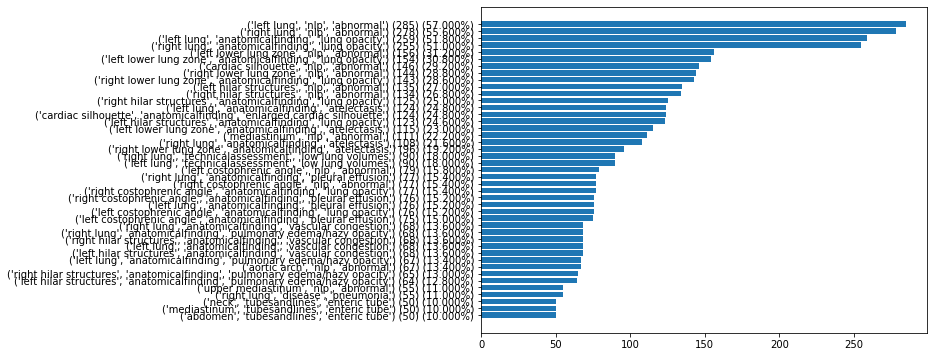

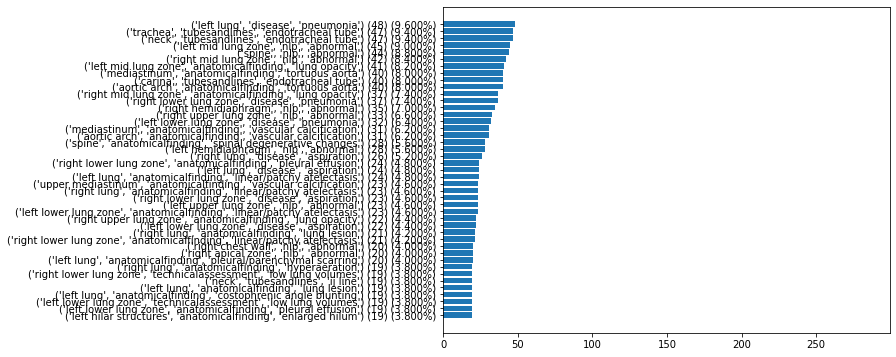

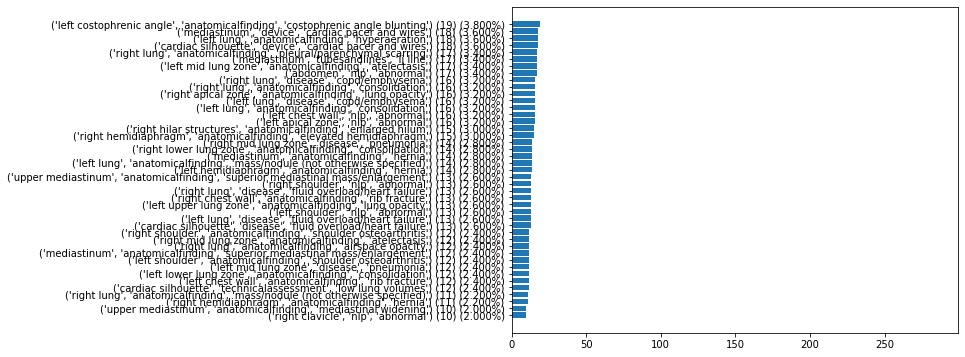

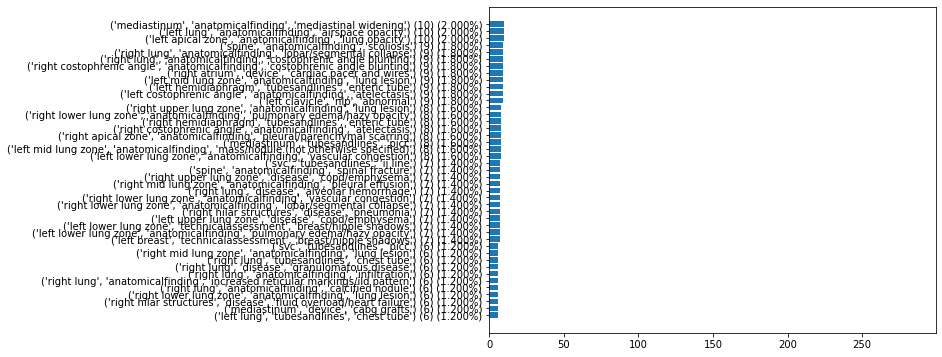

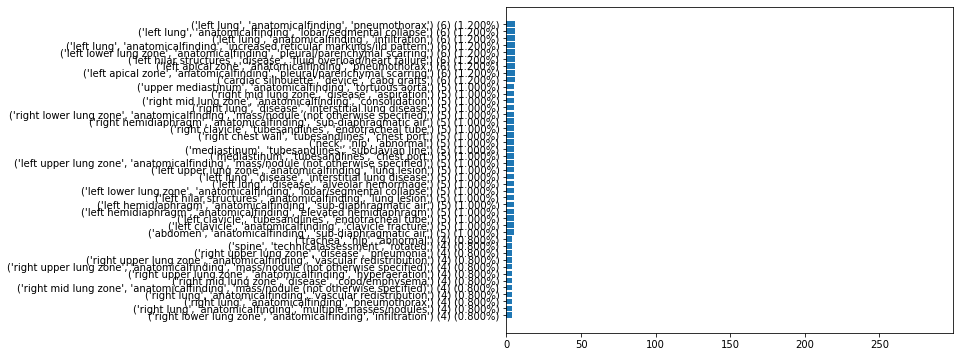

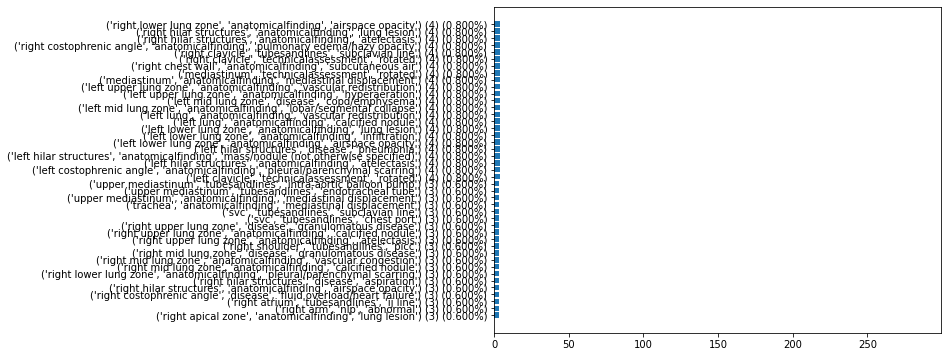

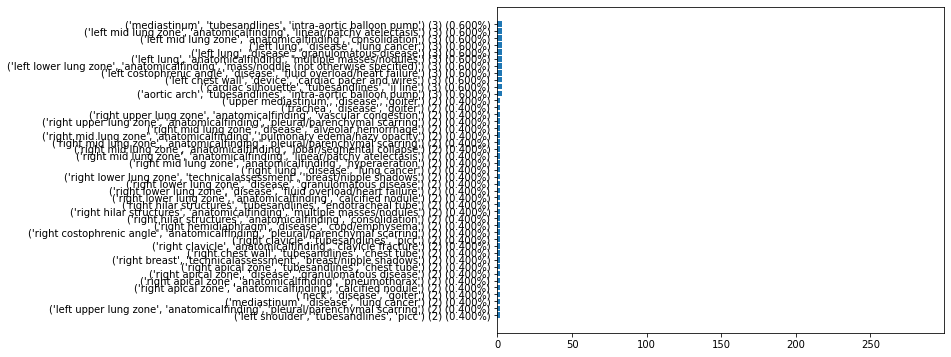

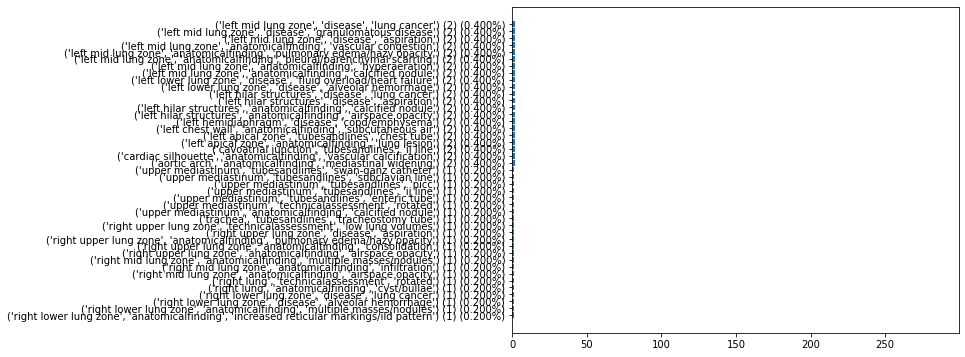

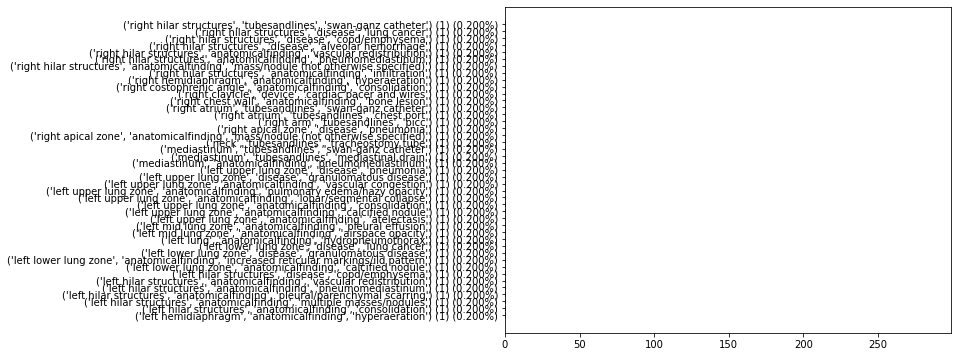

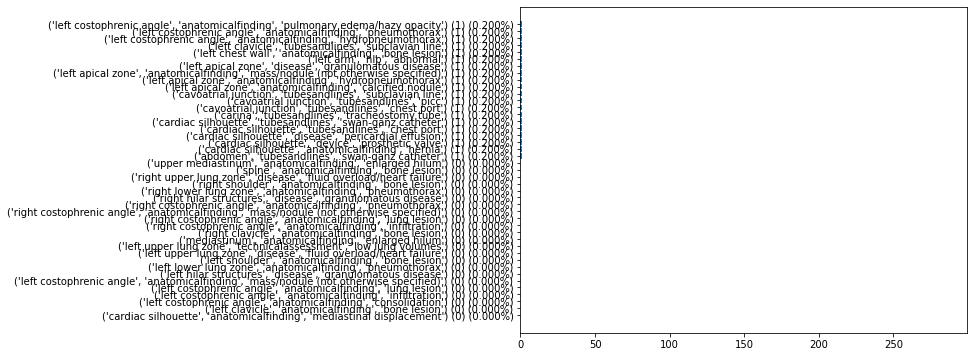

In [147]:
plot_chest_imagenome_localized_label_distribution(
    label_names=gold_label_names,
    image_id_to_binary_labels=gold_image_id_to_binary_labels,
    n_splits=10,
)

In [162]:
print_number_of_contradictions_per_class(
    label_names=gold_label_names,
    image_id_to_contradictions=gold_image_id_to_contradictions,
)

('left lung', 'nlp', 'abnormal'): 76
('right lung', 'nlp', 'abnormal'): 71
('cardiac silhouette', 'nlp', 'abnormal'): 41
('mediastinum', 'nlp', 'abnormal'): 40
('right lung', 'anatomicalfinding', 'lung opacity'): 15
('upper mediastinum', 'nlp', 'abnormal'): 14
('right hilar structures', 'nlp', 'abnormal'): 13
('left lung', 'anatomicalfinding', 'lung opacity'): 12
('left hilar structures', 'nlp', 'abnormal'): 10
('cardiac silhouette', 'anatomicalfinding', 'enlarged cardiac silhouette'): 8
('spine', 'nlp', 'abnormal'): 7
('left lung', 'anatomicalfinding', 'pulmonary edema/hazy opacity'): 7
('right lung', 'anatomicalfinding', 'pulmonary edema/hazy opacity'): 6
('right hilar structures', 'anatomicalfinding', 'pulmonary edema/hazy opacity'): 5
('left hilar structures', 'anatomicalfinding', 'pulmonary edema/hazy opacity'): 5
('right lung', 'anatomicalfinding', 'pleural effusion'): 4
('right clavicle', 'nlp', 'abnormal'): 4
('right costophrenic angle', 'anatomicalfinding', 'pleural effusion')

In [188]:
tmp = collect_dicom_ids_with_contradictions(
    label_names=gold_label_names,
    image_id_to_contradictions=gold_image_id_to_contradictions,
)

In [192]:
tmp[1]

('7408f72d-86b35213-cc2fa13c-d3e7facf-86aae3ca',
 6,
 [('right lower lung zone', 'anatomicalfinding', 'atelectasis'),
  ('right lower lung zone', 'anatomicalfinding', 'lobar/segmental collapse'),
  ('right lung', 'anatomicalfinding', 'atelectasis'),
  ('right lung', 'anatomicalfinding', 'lobar/segmental collapse'),
  ('right mid lung zone', 'anatomicalfinding', 'atelectasis'),
  ('right mid lung zone', 'anatomicalfinding', 'lobar/segmental collapse')])

In [193]:
filtered_df = df[df['image_id'] == f'{tmp[1][0]}.dcm']
for bbox, label_name, context, sentence in zip(filtered_df['bbox'],
                                     filtered_df['label_name'],
                                     filtered_df['context'],
                                    filtered_df['sentence']):
    print(f'{bbox}\t{label_name}\t{context}\t{sentence}')

neck	endotracheal tube	yes	WET READ: ___ ___ ___ 5:40 PM  In comparison to the examination from 3 hours prior there has been interval  placement of a tracheal tube which ends in the mid thoracic trachea.
trachea	endotracheal tube	yes	WET READ: ___ ___ ___ 5:40 PM  In comparison to the examination from 3 hours prior there has been interval  placement of a tracheal tube which ends in the mid thoracic trachea.
upper mediastinum	endotracheal tube	yes	WET READ: ___ ___ ___ 5:40 PM  In comparison to the examination from 3 hours prior there has been interval  placement of a tracheal tube which ends in the mid thoracic trachea.
cardiac silhouette	abnormal	yes	Mild  cardiomegaly is stable.
cardiac silhouette	enlarged cardiac silhouette	yes	Mild  cardiomegaly is stable.
right costophrenic angle	abnormal	yes	There has been rapid opacification of the inferior  right lower lobe, which may be due to rapidly accumulating pleural effusion or  aspiration, as there is no sign of volume loss.
right costo

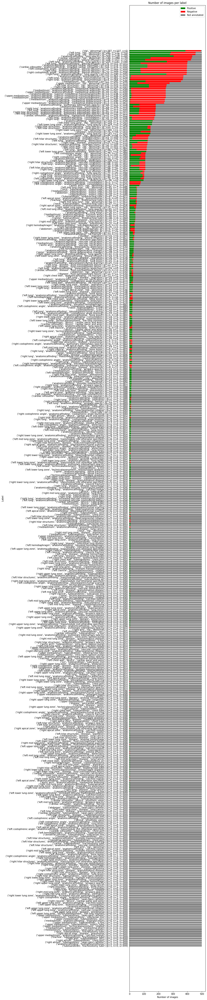

In [232]:
plot_positive_negative_masked_distribution_per_label(
    label_names=gold_label_names,
    image_id_to_binary_labels=gold_image_id_to_binary_labels,
    image_id_to_mask=gold_image_id_to_mask,
    figsize=(6, 80),
    num_workers=6,
)

# Inspecting Gender metadata

In [13]:
from medvqa.datasets.chest_imagenome.chest_imagenome_dataset_management import (
    get_dicomId2gender, load_scene_graph, visualize_scene_graph
)

In [ ]:
dicomId2gender = get_dicomId2gender()

In [4]:
len(dicomId2gender)

243310

In [6]:
values = list(dicomId2gender.values())

In [20]:
from collections import Counter
import numpy as np